In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns

#1. Using Average Price as Target Variable

# Importing Dataset

In [264]:
from google.colab import files

uploaded = files.upload()

Saving avocado.csv to avocado (5).csv


In [265]:
df=pd.read_csv("avocado.csv")
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,12/27/2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,12/20/2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,12/13/2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,12/6/2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,11/29/2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [ ]:
df.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [ ]:
df.shape

(18249, 14)

- Dataset has 18249 rows and 14 columns

In [ ]:
df.dtypes

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

# Checking for null values 

In [ ]:
df.isnull().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

- There are no null values present.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


Since the  following features are count (i.e number of avocado and bags), it should be in discrete numeric value and not continuous value.

- Total Volume  
-4046          
-4225       
-4770    
-Total Bags   
-Small Bags 
-Large Bags    
-XLarge Bags  

In [ ]:
list1=["Total Volume","4046","4225","4770",	"Total Bags",	"Small Bags",	"Large Bags",	"XLarge Bags"]

for i in list1:
  df[list1]=df[list1].astype(int)

df.dtypes


Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume      int64
4046              int64
4225              int64
4770              int64
Total Bags        int64
Small Bags        int64
Large Bags        int64
XLarge Bags       int64
type             object
year              int64
region           object
dtype: object

- We have converted the above features from float to int type.

In [ ]:
for i in range(len(df["Total Volume"])):
  df.iloc[i,3]=df.iloc[i,4]+df.iloc[i,5]+df.iloc[i,6]+df.iloc[i,7]+df.iloc[i,8]+df.iloc[i,9]+df.iloc[i,10]   

df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,12/27/2015,1.33,72930,1036,54454,48,8696,8603,93,0,conventional,2015,Albany
1,1,12/20/2015,1.35,64380,674,44638,58,9505,9408,97,0,conventional,2015,Albany
2,2,12/13/2015,0.93,126363,794,109149,130,8145,8042,103,0,conventional,2015,Albany
3,3,12/6/2015,1.08,84801,1132,71976,72,5811,5677,133,0,conventional,2015,Albany
4,4,11/29/2015,1.28,57220,941,43838,75,6183,5986,197,0,conventional,2015,Albany


- Recalculated total volume after converting columns to int.

In [ ]:
months=[]
days=[]
for i in range(len(df["Date"])):
  if df.iloc[i,1][1:2]=='/':
    months.append(df.iloc[i,1][0:1])
  else:
    months.append(df.iloc[i,1][0:2])
  if df.iloc[i,1][-7:-6]=='/':
    days.append(df.iloc[i,1][-6:-5]) 
  else: 
    days.append(df.iloc[i,1][-7:-5])

- Storing days and months from date into list.

# Visulaization

2017    5722
2016    5616
2015    5615
2018    1296
Name: year, dtype: int64


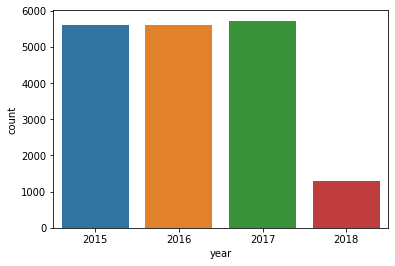

In [ ]:
sns.countplot(df["year"])
print(df['year'].value_counts())

Avocado Sold in a year.

- 2017   - 5722 avocado
-2016   - 5616 avocado
-2015   - 5615 avocado
-2018   - 1296 avocado


conventional    9126
organic         9123
Name: type, dtype: int64


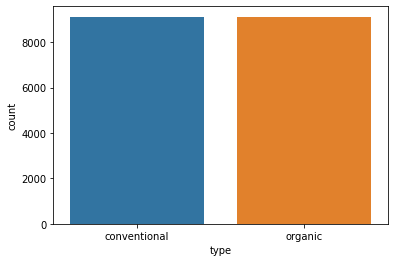

In [ ]:
sns.countplot(df["type"])
print(df['type'].value_counts())

Avocado Type sold
- conventional    - 9126 
-organic         - 9123 

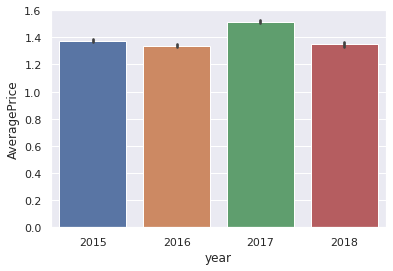

In [ ]:
sns.barplot(y=df["AveragePrice"],x=df["year"])

- 2017 had highest average price of avocado
- 2016 had lowest average price of avocado

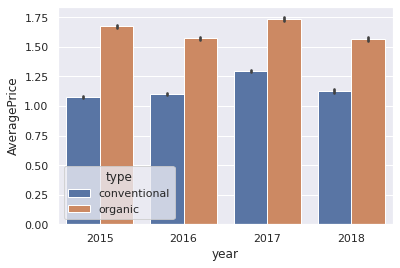

In [ ]:
sns.barplot(y=df["AveragePrice"],x=df["year"],hue=df["type"])

- Conventional avocado type had highest average price in 2017 and lowest average price in 2015.
- Organic avocado type had highest average price in 2017 and lowest average price in 2016 and 2018.

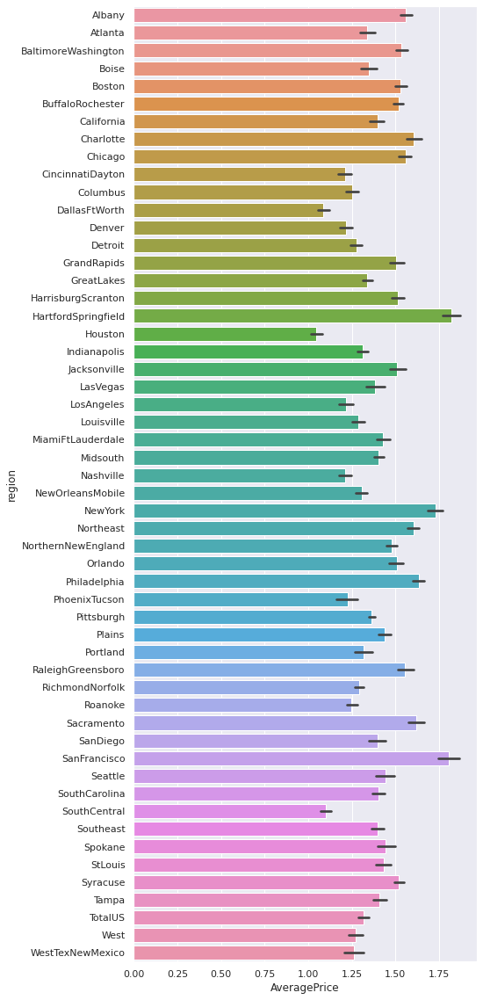

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["AveragePrice"],y=df["region"])

- HartfordSpringfield has highest average price for avocado.
- Houston has lowest average price for avocado.

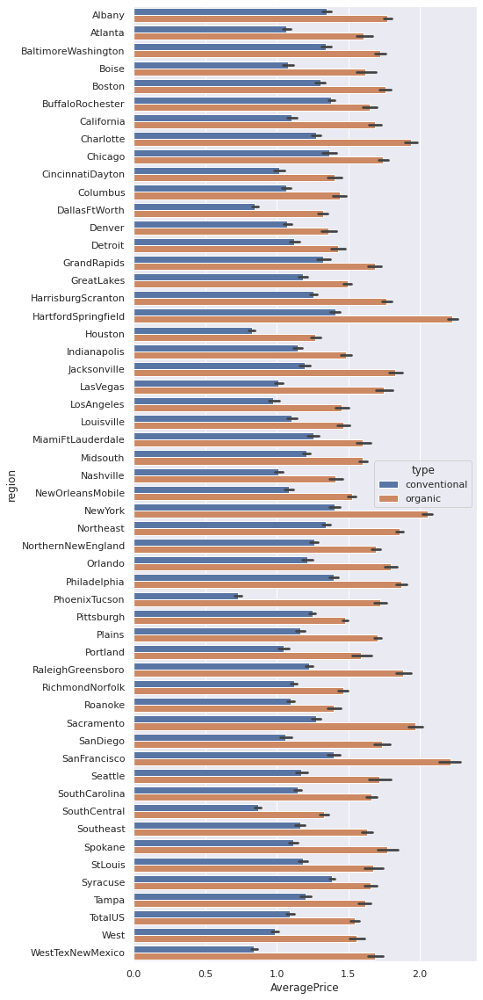

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["AveragePrice"],y=df["region"],hue=df['type'])

Conventional Type
- PhoneixTucson has lowest average price for convetional avocado type
- NewYork has highest average price for conventional avocado type

Organic Type
- Houston has lowest average price for organic avocado type
- San Francisco has highest average price for organic avocado type

- Extracting months and days from Date column into list.

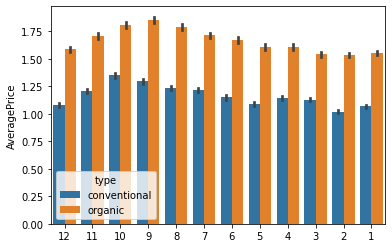

In [ ]:

sns.barplot(y=df["AveragePrice"],x=months,hue=df['type'])

Conventional Type
- Month 10(October) has highest average price.
-Month 2(February) has lowest average price.

Organic Type
- Month 9(September) has highest average price
- Month 2(February) has lowest average price

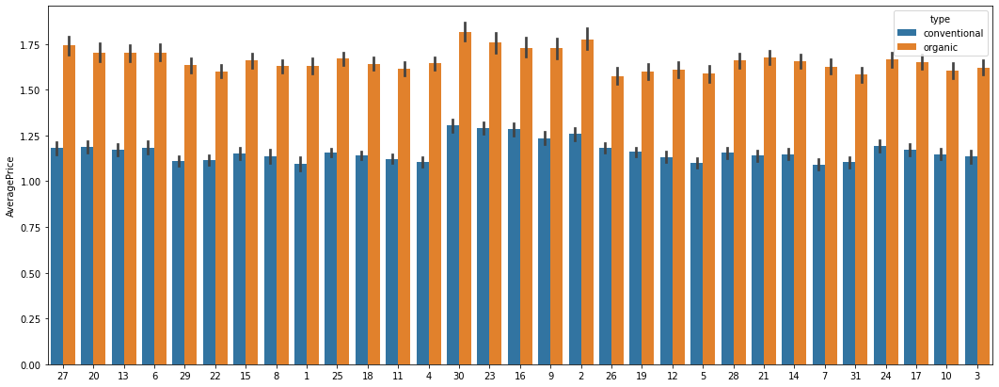

In [ ]:
plt.figure(figsize=(18,7))
sns.barplot(y=df["AveragePrice"],x=days,hue=df['type'])

Conventional Type
- On average, 30th of every month have highest average price 
- On average, 1st and 7th  of every month have lowest average price 

Organic Type
-  On average, 30th of every month have highest average price 
- On average, 22nd of every month have lowest average price 



Text(0, 0.5, 'year')

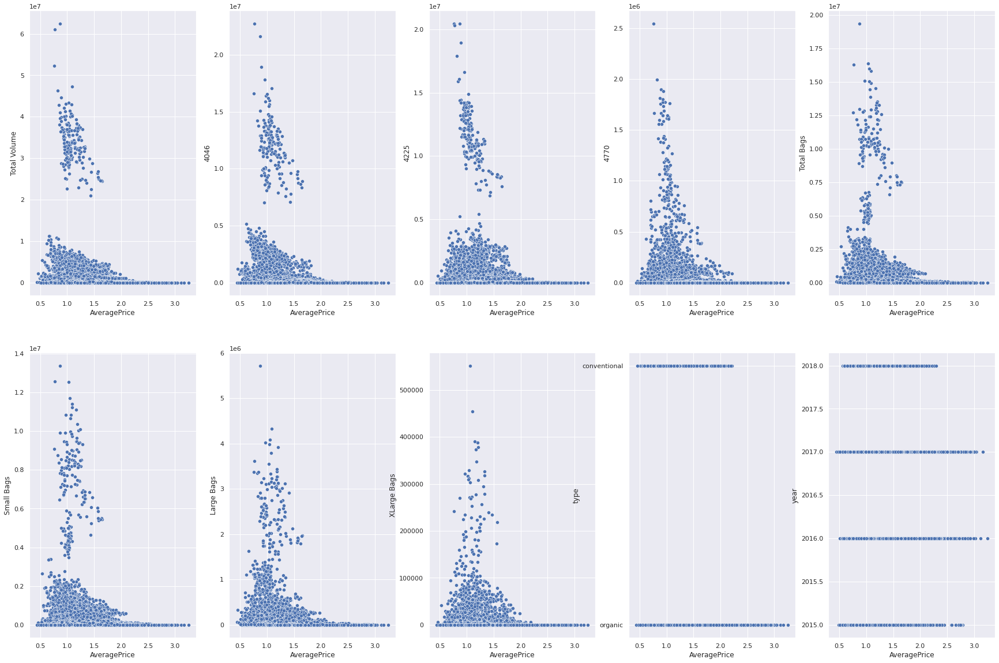

In [ ]:
import matplotlib.pyplot as plt
sns.set()
fig, axes = plt.subplots(2, 5,figsize=(30, 20))


sns.scatterplot(y=df["Total Volume"],x=df["AveragePrice"],ax=axes[0,0])
axes[0,0].set_ylabel("Total Volume")

sns.scatterplot(y=df["4046"],x=df["AveragePrice"],ax=axes[0,1])
axes[0,1].set_ylabel("4046")

sns.scatterplot(y=df["4225"],x=df["AveragePrice"],ax=axes[0,2])
axes[0,2].set_ylabel("4225")

sns.scatterplot(y=df["4770"],x=df["AveragePrice"],ax=axes[0,3])
axes[0,3].set_ylabel("4770")

sns.scatterplot(y=df["Total Bags"],x=df["AveragePrice"],ax=axes[0,4])
axes[0,4].set_ylabel("Total Bags")

sns.scatterplot(y=df["Small Bags"],x=df["AveragePrice"],ax=axes[1,0])
axes[1,0].set_ylabel("Small Bags")

sns.scatterplot(y=df["Large Bags"],x=df["AveragePrice"],ax=axes[1,1])
axes[1,1].set_ylabel("Large Bags")

sns.scatterplot(y=df["XLarge Bags"],x=df["AveragePrice"],ax=axes[1,2])
axes[1,2].set_ylabel("XLarge Bags")

sns.scatterplot(y=df["type"],x=df["AveragePrice"],ax=axes[1,3])
axes[1,3].set_ylabel("type")

sns.scatterplot(y=df["year"],x=df["AveragePrice"],ax=axes[1,4])
axes[1,4].set_ylabel("year")





Average Price in 
- Total Volume, 4046, 4770, 4225, Total Bags, Small Bags, Large Bags, XLarge Bags is non linearly distributed.

- Type is equally distributed between 0.5 and 1.0
- Year is equally distributed between 0.5 and 1.5

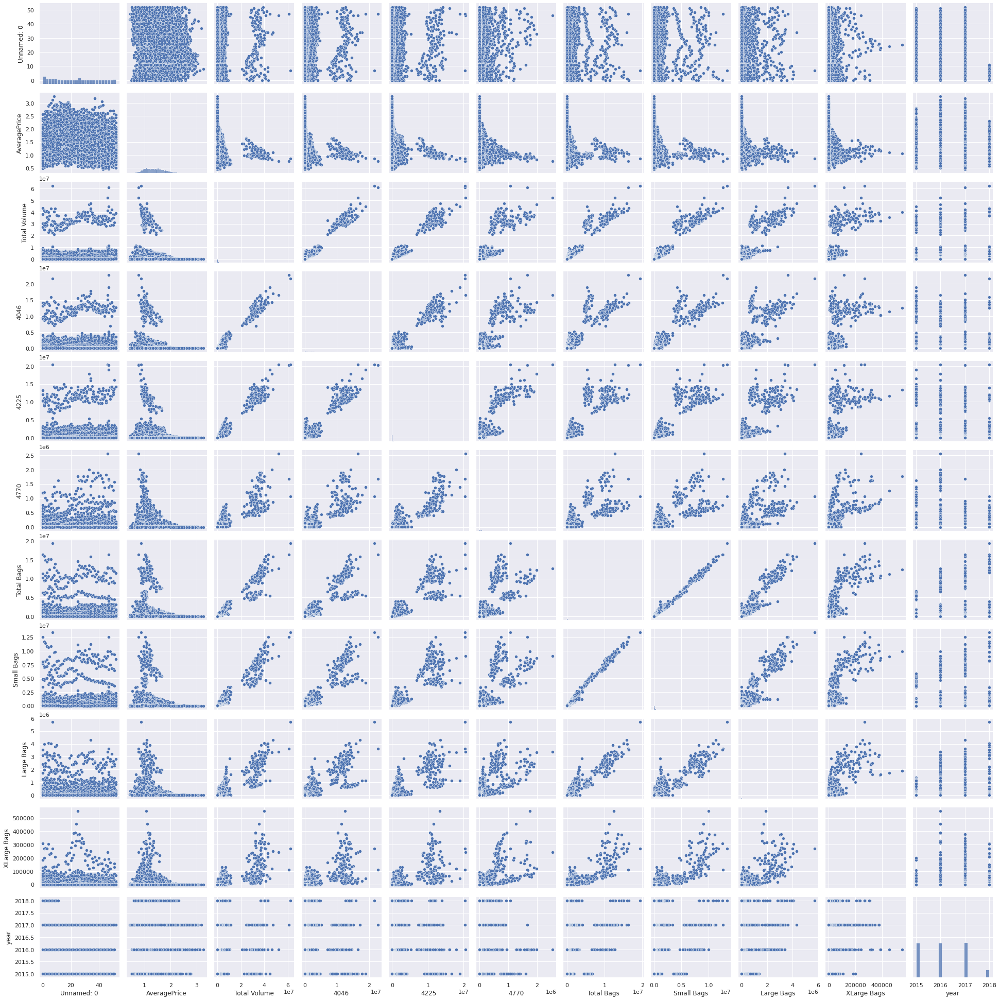

In [266]:
sns.pairplot(df)

# Checking Correlation

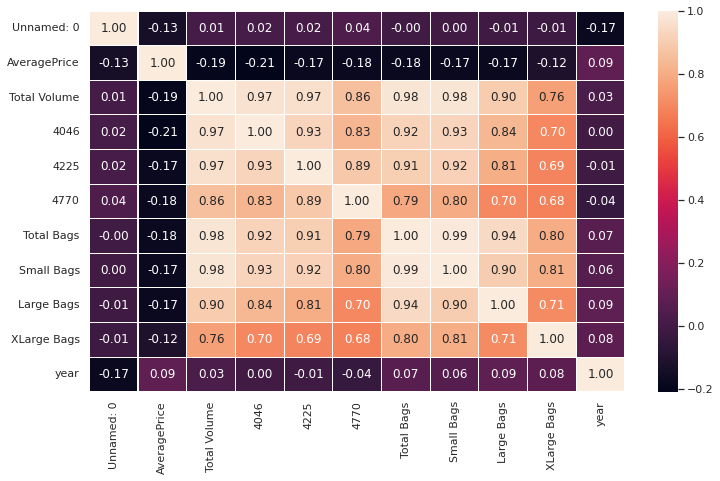

In [ ]:
plt.figure(figsize=(12,7))
sns.heatmap(df.corr(),annot=True,linewidths=0.1,linecolor="White",fmt=".2f")

- Total Volume has -19 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- 4046 has -21 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- 4225 has -17 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- 4770 has -18 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- Total Bags has -18 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- Small Bags has -17 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- Large Bags Volume has -17 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- XLarge Bags has -12 percent correlation with target column (AveragePrice) which is considered as a strong -ve bond.
- Year has 9 percent correlation with target column (AveragePrice) which is considered as a weak +ve bond.

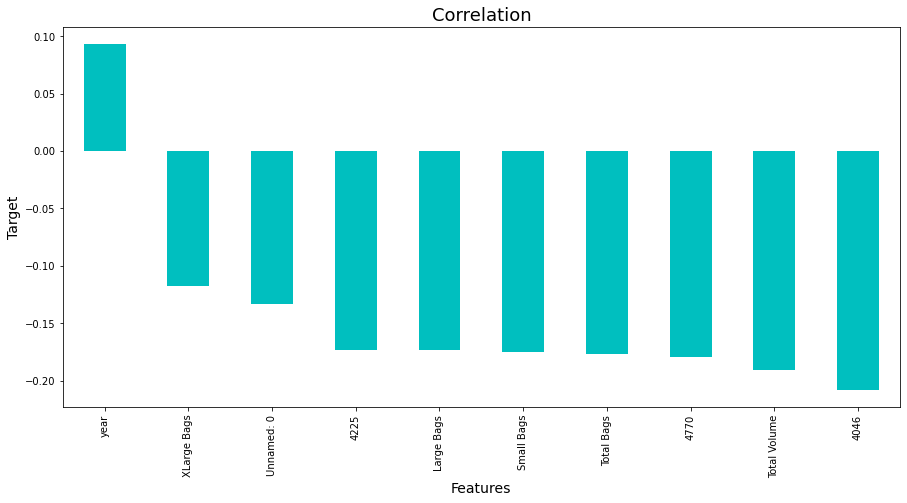

In [ ]:
plt.figure(figsize=(15,7))
df.corr()['AveragePrice'].sort_values(ascending=False).drop(['AveragePrice']).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()


- Max -ve correlation : 4046
- Min -ve correlation : XLarge Bags

- Max +ve correlation : Year
- Min +ve correlation : Year

# Describing Data

In [ ]:
df.describe()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,18249.000000,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000
mean,24.232232,1.405978,1.090278e+06,2.930079e+05,2.951541e+05,2.283940e+04,2.396387e+05,1.821942e+05,5.433767e+04,3106.279029,2016.147899
std,15.481045,0.402677,4.411348e+06,1.264989e+06,1.204120e+06,1.074640e+05,9.862424e+05,7.461785e+05,2.439659e+05,17692.837485,0.939938
min,0.000000,0.440000,1.580000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000
25%,10.000000,1.100000,1.633800e+04,8.540000e+02,3.008000e+03,0.000000e+00,5.088000e+03,2.849000e+03,1.270000e+02,0.000000,2015.000000
50%,24.000000,1.370000,1.505430e+05,8.645000e+03,2.906100e+04,1.840000e+02,3.974300e+04,2.636200e+04,2.647000e+03,0.000000,2016.000000
75%,38.000000,1.660000,5.464260e+05,1.110200e+05,1.502060e+05,6.243000e+03,1.107830e+05,8.333700e+04,2.202900e+04,132.000000,2017.000000
max,52.000000,3.250000,8.187878e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719096e+06,551693.000000,2018.000000


- The  standard deviation indicate that the data is highly spread in some of the features.
- There is huge gap between 75% and Max value which indicates presence of outlier in some of the features.

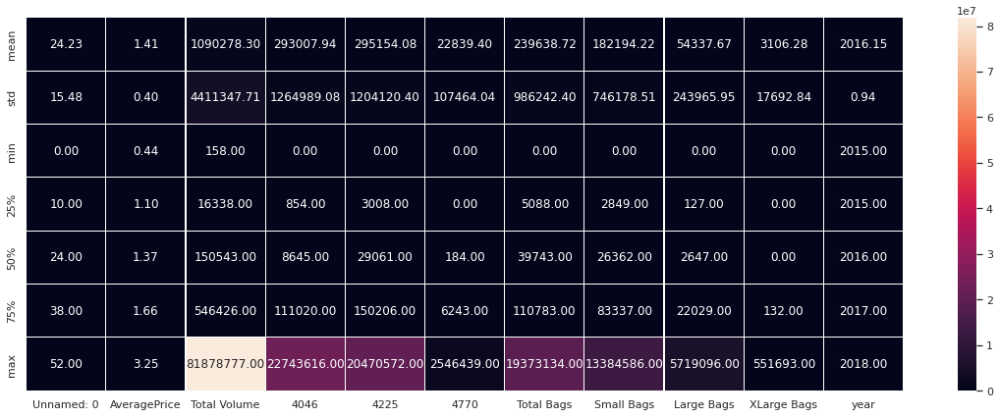

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,7))
sns.heatmap(df.describe()[1:],annot=True,linewidths=0.1,linecolor="White",fmt=".2f")

AveragePrice	
- mean -	1.405978
- std	- 0.402677	
- min -	0.000000	
-max -	3.250000

Total Volume	
- mean -	1.090278e+06
- std	- 4.411348e+06
- min - 0.440000	
-max -	8.187878e+07

4046	
- mean -	2.930079e+05
- std	- 1.264989e+06
- min -	1.580000e+02
-max -	2.274362e+07

4225	
- mean -	2.951541e+05
- std	- 1.204120e+06
- min -	0.000000e+00
-max -	2.047057e+07

4770	
- mean -	2.283940e+04
- std	- 1.074640e+05
- min -	0.000000e+00	
-max -	2.546439e+06

Total Bags	
- mean -	2.396387e+05
- std	- 9.862424e+05
- min -	0.000000e+00
-max -	1.937313e+07

Small Bags	
- mean -	1.821942e+05
- std	- 7.461785e+05
- min -	0.000000e+00
-max -	1.338459e+07

Large Bags	
- mean -	5.433767e+04	
- std	- 2.439659e+05
- min -	0.000000e+00	
-max -	5.719096e+06

XLarge Bags	
- mean -	3106.279029	
- std	- 	17692.837485
- min -		0.000000
-max -	551693.000000

year
- mean -	2016.147899
- std	- 0.939938
- min -		2015.000000
-max - 2018.000000



# Separating input feature and target data (Average Price)

In [ ]:
df["Day"]=days
df["Month"]=months

x=df.drop(["AveragePrice"	,"Unnamed: 0","Date"],axis=1)
x.head()

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Day,Month
0,72930,1036,54454,48,8696,8603,93,0,conventional,2015,Albany,27,12
1,64380,674,44638,58,9505,9408,97,0,conventional,2015,Albany,20,12
2,126363,794,109149,130,8145,8042,103,0,conventional,2015,Albany,13,12
3,84801,1132,71976,72,5811,5677,133,0,conventional,2015,Albany,6,12
4,57220,941,43838,75,6183,5986,197,0,conventional,2015,Albany,29,11


- Since Year column already existed, we extracted day and month from Date column and then dropped Date column.


In [ ]:
x.dtypes

Total Volume     int64
4046             int64
4225             int64
4770             int64
Total Bags       int64
Small Bags       int64
Large Bags       int64
XLarge Bags      int64
type            object
year             int64
region          object
Day             object
Month           object
dtype: object

In [ ]:
y=df["AveragePrice"]
y.head()

0    1.33
1    1.35
2    0.93
3    1.08
4    1.28
Name: AveragePrice, dtype: float64

# Encoding Categorical features

In [ ]:
from sklearn.preprocessing import LabelEncoder 

enc=LabelEncoder()

list2=["type","year","region"]

for i in list2:
  x[i]=enc.fit_transform(x[i].values.reshape(-1,1))
  
x.head()

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Day,Month
0,72930,1036,54454,48,8696,8603,93,0,0,0,0,27,12
1,64380,674,44638,58,9505,9408,97,0,0,0,0,20,12
2,126363,794,109149,130,8145,8042,103,0,0,0,0,13,12
3,84801,1132,71976,72,5811,5677,133,0,0,0,0,6,12
4,57220,941,43838,75,6183,5986,197,0,0,0,0,29,11


In [ ]:
list2=["Day","Month"]
for i in list2:
  x[i]=x[i].astype(int)

- Converting Day and Month columns from object type to int type.

# Detecting Skewness

In [ ]:
x.skew().sort_values()

region           0.000030
type             0.000329
Day              0.014310
Month            0.106617
year             0.215339
4046             8.648220
4225             8.942466
Total Volume     9.093447
Small Bags       9.540660
Total Bags       9.756072
Large Bags       9.796456
4770            10.159401
XLarge Bags     13.139822
dtype: float64

Keeping +/-0.5 as the range for skewness we can see following have skewness
- Total Bags    
-XLarge Bags  
-Small Bags     
-Total Volume    
-4770            
-Large Bags      
-4225            
-4046           


Text(0, 0.5, '4046')

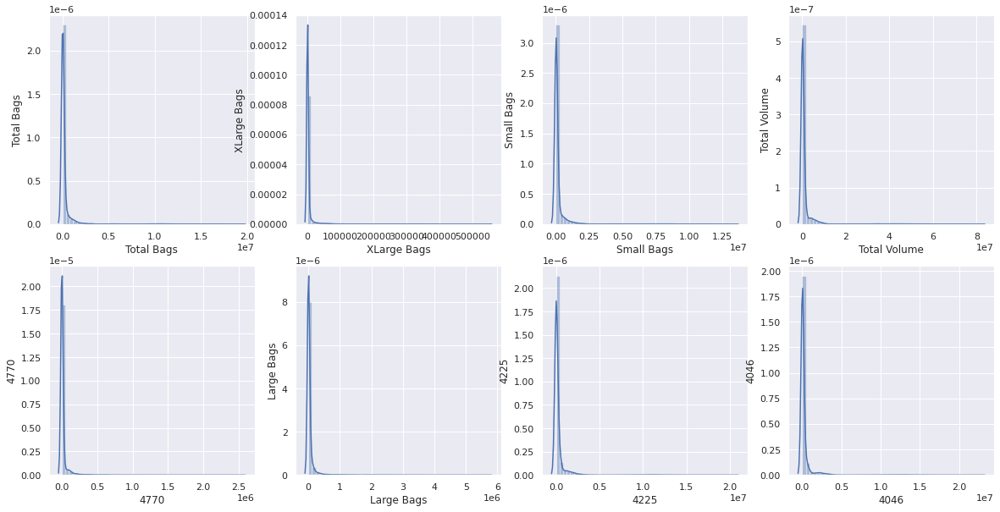

In [ ]:
import matplotlib.pyplot as plt
sns.set()
fig, axes = plt.subplots(2, 4,figsize=(20, 10))

sns.distplot(x["Total Bags"],ax=axes[0,0])
axes[0,0].set_ylabel("Total Bags")

sns.distplot(x["XLarge Bags"],ax=axes[0,1])
axes[0,1].set_ylabel("XLarge Bags")

sns.distplot(x["Small Bags"],ax=axes[0,2])
axes[0,2].set_ylabel("Small Bags")

sns.distplot(x["Total Volume"],ax=axes[0,3])
axes[0,3].set_ylabel("Total Volume")

sns.distplot(x["4770"],ax=axes[1,0])
axes[1,0].set_ylabel("4770")

sns.distplot(x["Large Bags"],ax=axes[1,1])
axes[1,1].set_ylabel("Large Bags")

sns.distplot(x["4225"],ax=axes[1,2])
axes[1,2].set_ylabel("4225")

sns.distplot(x["4046"],ax=axes[1,3])
axes[1,3].set_ylabel("4046")





- All the columns displayed above are of discrete data type and right skewed.

In [ ]:
from sklearn.preprocessing import power_transform
list2=["Total Bags","XLarge Bags","Small Bags","Total Volume","4770","Large Bags","4225","4046"]     
for i in list2:
  x[i]=power_transform(x[i].values.reshape(-1,1))


Text(0, 0.5, '4046')

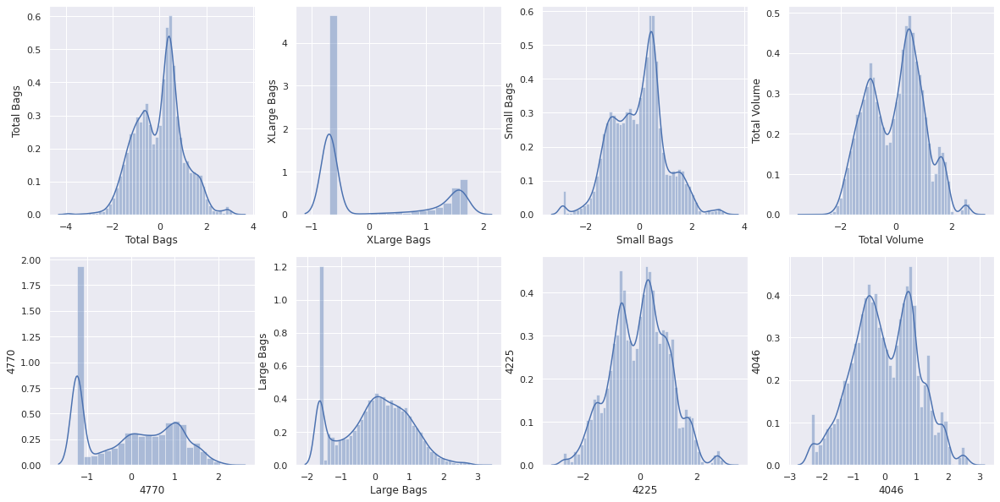

In [ ]:
import matplotlib.pyplot as plt
sns.set()
fig, axes = plt.subplots(2, 4,figsize=(20, 10))

sns.distplot(x["Total Bags"],ax=axes[0,0])
axes[0,0].set_ylabel("Total Bags")

sns.distplot(x["XLarge Bags"],ax=axes[0,1])
axes[0,1].set_ylabel("XLarge Bags")

sns.distplot(x["Small Bags"],ax=axes[0,2])
axes[0,2].set_ylabel("Small Bags")

sns.distplot(x["Total Volume"],ax=axes[0,3])
axes[0,3].set_ylabel("Total Volume")

sns.distplot(x["4770"],ax=axes[1,0])
axes[1,0].set_ylabel("4770")

sns.distplot(x["Large Bags"],ax=axes[1,1])
axes[1,1].set_ylabel("Large Bags")

sns.distplot(x["4225"],ax=axes[1,2])
axes[1,2].set_ylabel("4225")

sns.distplot(x["4046"],ax=axes[1,3])
axes[1,3].set_ylabel("4046")





After transformation
- all the columns displayed above are of discrete data type.

In [ ]:
x.skew().sort_values()

Large Bags     -0.074401
4046           -0.022909
4225           -0.017585
Total Bags     -0.001581
region          0.000030
type            0.000329
Small Bags      0.007183
Total Volume    0.010220
Day             0.014310
4770            0.032912
Month           0.106617
year            0.215339
XLarge Bags     0.797699
dtype: float64

In [ ]:
a=np.cbrt(x['XLarge Bags'])
a=np.cbrt(a)
a.skew()

0.6935020253420144

- After performing mutliple transformation technique on XLarge Bags, it has been observed that the skewness cannot be reduced beyond 0.69. 

- After looking at correlation matrix, it has been observed that XLarge Bags feature contribution towards target column is least among all the features and hence we drop the column.

In [ ]:
x2=x.drop(["XLarge Bags"],axis=1)
x2.skew().sort_values()

Large Bags     -0.074401
4046           -0.022909
4225           -0.017585
Total Bags     -0.001581
region          0.000030
type            0.000329
Small Bags      0.007183
Total Volume    0.010220
Day             0.014310
4770            0.032912
Month           0.106617
year            0.215339
dtype: float64

In [ ]:
df=x2

# Checking Outliers

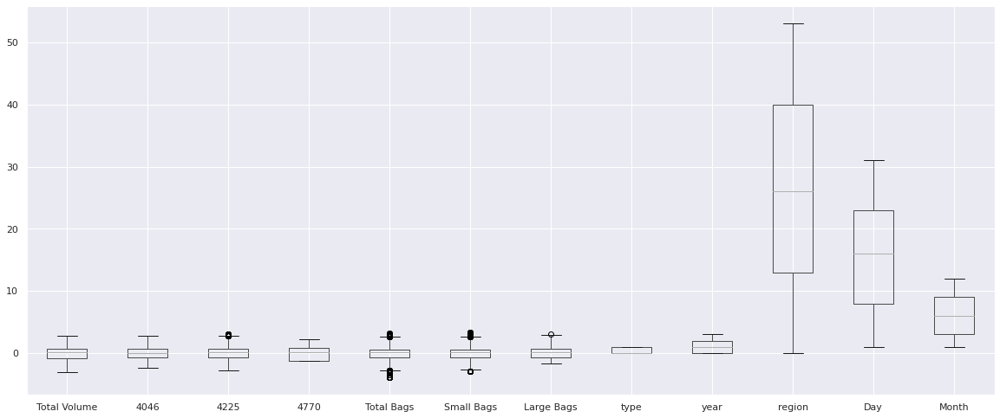

In [ ]:
import matplotlib.pyplot as plt
df.iloc[:,0:13].boxplot(figsize=(20,8))
plt.subplots_adjust(bottom=0.1)
plt.show()

The following features contains outliers
- 4225	
-Total Bags	
-Small Bags	
-Large Bags	

In [ ]:
new_df_cap = df.copy()

In [ ]:
def remove_outliers(n):
    Q1 = np.percentile(df[n], 25, interpolation = 'midpoint')  
    Q3 = np.percentile(df[n], 75, interpolation = 'midpoint') 
    iqr = Q3 - Q1 
    percentile25 = df[n].quantile(0.25)
    percentile75 = df[n].quantile(0.75)
    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr
    df[df[n] > upper_limit]
    df[df[n] < lower_limit]
    
    new_df = df[df[n] < upper_limit]
    new_df.shape
    
    new_df_cap[n] = np.where(
    new_df_cap[n] > upper_limit,
    upper_limit,
    np.where(
        new_df_cap[n] < lower_limit,
        lower_limit,
        new_df_cap[n] ) )
    
    sns.boxplot(new_df_cap[n])
    

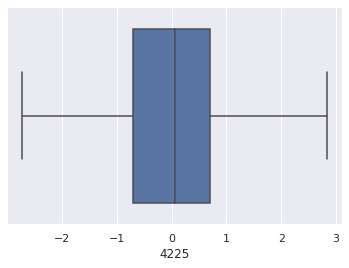

In [ ]:
remove_outliers("4225")

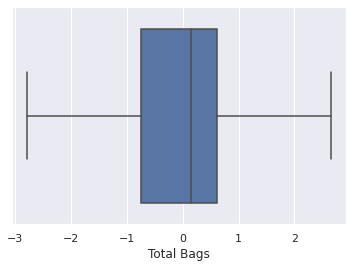

In [ ]:
remove_outliers("Total Bags")

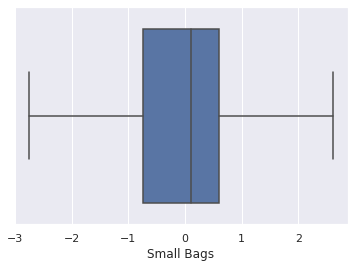

In [ ]:
remove_outliers("Small Bags")

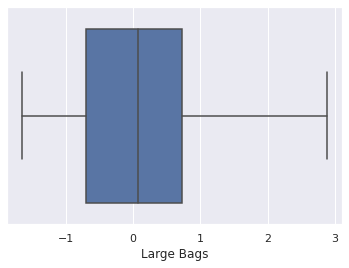

In [ ]:
remove_outliers("Large Bags")

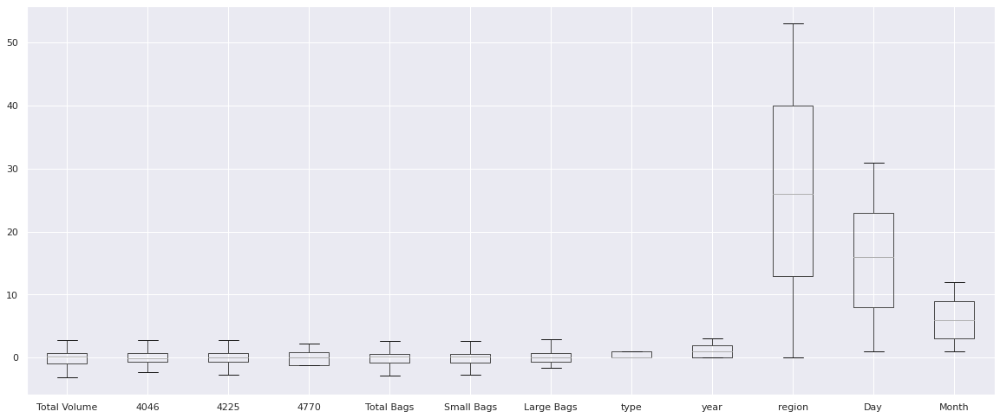

In [ ]:
import matplotlib.pyplot as plt
new_df_cap.iloc[:,0:13].boxplot(figsize=(20,8))
plt.subplots_adjust(bottom=0.1)
plt.show()

# Detecting Multicollinearity

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [ ]:
calc_vif(new_df_cap)

,variables,VIF
0,Total Volume,54.016353
1,4046,6.246406
2,4225,9.020503
3,4770,3.943434
4,Total Bags,43.008030
5,Small Bags,16.099482
6,Large Bags,3.537534
7,type,5.469675
8,year,2.662702
9,region,3.674826


VIF > 5 indicates presence of multicollinearity in the dataset
- We drop Total Bags and 4225 features as they have very high collinearity and least contribution towards target column.

In [ ]:
X=new_df_cap.drop(["Total Bags","4225"],axis=1)
calc_vif(X)

,variables,VIF
0,Total Volume,16.785573
1,4046,5.174161
2,4770,3.638567
3,Small Bags,7.761115
4,Large Bags,2.274051
5,type,5.442048
6,year,2.595963
7,region,3.673173
8,Day,3.361221
9,Month,3.058712


# Traning and Testing with AveragePrice as target

# Scaling

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split


mns=MinMaxScaler()
s=mns.fit_transform(X)
x=pd.DataFrame(data=s)
print(x)

              0         1         2         3         4    5    6    7  \
0      0.495975  0.329768  0.289001  0.450301  0.192563  0.0  0.0  0.0   
1      0.486428  0.306592  0.302314  0.456660  0.194637  0.0  0.0  0.0   
2      0.537799  0.315377  0.359009  0.445534  0.197606  0.0  0.0  0.0   
3      0.507492  0.334598  0.317524  0.421277  0.210411  0.0  0.0  0.0   
4      0.477381  0.324547  0.320395  0.424929  0.230601  0.0  0.0  0.0   
...         ...       ...       ...       ...       ...  ...  ...  ...   
18244  0.428950  0.367307  0.000000  0.480362  0.272687  1.0  1.0  1.0   
18245  0.407292  0.337374  0.000000  0.453028  0.257059  1.0  1.0  1.0   
18246  0.407316  0.337374  0.478306  0.456227  0.154767  1.0  1.0  1.0   
18247  0.419787  0.351039  0.478306  0.467339  0.162832  1.0  1.0  1.0   
18248  0.426186  0.386839  0.397014  0.474094  0.133268  1.0  1.0  1.0   

              8         9  
0      0.866667  1.000000  
1      0.633333  1.000000  
2      0.400000  1.000000  

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
lr=LinearRegression()

for i in range(0,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f"At random state {i}, training accuracy: {r2_score(y_train,pred_train)}")
    print(f"At random state {i}, testing accuracy: {r2_score(y_test,pred_test)}")
    print("\n")

At random state 0, training accuracy: 0.49095263936171796
At random state 0, testing accuracy: 0.4972995964439063


At random state 1, training accuracy: 0.49014183782121457
At random state 1, testing accuracy: 0.5013325690259252


At random state 2, training accuracy: 0.4947239395894054
At random state 2, testing accuracy: 0.48275026218617145


At random state 3, training accuracy: 0.49276625210226754
At random state 3, testing accuracy: 0.49077432865329296


At random state 4, training accuracy: 0.4947090047442785
At random state 4, testing accuracy: 0.48296554488004884


At random state 5, training accuracy: 0.49180460764469236
At random state 5, testing accuracy: 0.4936824259895426


At random state 6, training accuracy: 0.4915943794463441
At random state 6, testing accuracy: 0.49552247871493915


At random state 7, training accuracy: 0.4926619347235123
At random state 7, testing accuracy: 0.49124715720328826


At random state 8, training accuracy: 0.49348802803221514
At random sta

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=999)

In [ ]:
lr.fit(x_train,y_train) 
pred_train=lr.predict(x_train)
print("Testing Score:",r2_score(y_test,pred_test)*100)

Testing Score: 49.04396587634664


In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
print("Mean Absolute Error ",mean_absolute_error(y_test,pred_test))
print("Mean Sq. Error ",mean_squared_error(y_test,pred_test))
print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,pred_test)))

Mean Absolute Error  0.22756639812559806
Mean Sq. Error  0.08477188672053662
Root Mean Sq  0.2911561208708081


# Cross validation

In [ ]:
train_ac=r2_score(y_train,pred_train)
test_ac=r2_score(y_test,pred_test)

from sklearn.model_selection import cross_val_score
for j in range(2,20):
    cv_score=cross_val_score(lr,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cv= {j} cv score is {cv_mean} and accuracy for training is {train_ac} and testing is {train_ac}")
    print("\n")

At cv= 2 cv score is -0.9346032391894761 and accuracy for training is 0.49285507150723906 and testing is 0.49285507150723906


At cv= 3 cv score is 0.035154308625662156 and accuracy for training is 0.49285507150723906 and testing is 0.49285507150723906


At cv= 4 cv score is -0.015808668769527856 and accuracy for training is 0.49285507150723906 and testing is 0.49285507150723906


At cv= 5 cv score is 0.08090903461741697 and accuracy for training is 0.49285507150723906 and testing is 0.49285507150723906


At cv= 6 cv score is -0.02821869932105825 and accuracy for training is 0.49285507150723906 and testing is 0.49285507150723906


At cv= 7 cv score is 0.032670243826378016 and accuracy for training is 0.49285507150723906 and testing is 0.49285507150723906


At cv= 8 cv score is -0.0053480546451113165 and accuracy for training is 0.49285507150723906 and testing is 0.49285507150723906


At cv= 9 cv score is 0.04997747719633978 and accuracy for training is 0.49285507150723906 and testing i

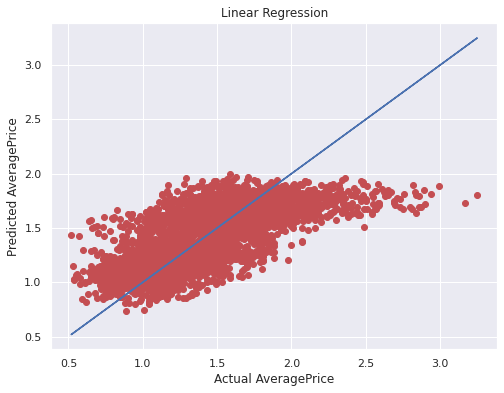

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual AveragePrice")
plt.ylabel("Predicted AveragePrice")
plt.title("Linear Regression")
plt.show()

# Regularization

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso

parameters={'alpha':[.0001,.001,.01,.1,1,10],
            'random_state': list(range(0,10)),
            'selection':['cyclic', 'random'],
            'fit_intercept': ['True','False']}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.0001, 'fit_intercept': 'True', 'random_state': 9, 'selection': 'random'}


In [ ]:
ls=Lasso(alpha=0.0001,random_state=9,fit_intercept=True,selection='random')
ls.fit(x_train,y_train)
ls_score_train=ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)
ls_score_train*100

49.28323969345624

In [ ]:
lss=r2_score(y_test,pred_ls)
lss*100

49.04182696638289

In [ ]:
cv_score=cross_val_score(ls,x,y,cv=5)
cv_mean=cv_score.mean()
print(cv_mean*100)

8.455690302250936


In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

def model_selection(algorithm_instance,x_train,y_train,x_test,y_test):
    algorithm_instance.fit(x_train,y_train)
    model_pred_train=algorithm_instance.predict(x_train)
    model_pred_test=algorithm_instance.predict(x_test)
    print("Accuracy of training model :",r2_score(y_train,model_pred_train)*100)
    print("Accuracy of test data :",r2_score(y_test,model_pred_test)*100)
    rfscore=cross_val_score(algorithm_instance,x,y,cv=5)
    rfc=rfscore.mean()
    print('Cross Val Score:',rfc*100)
    print("\nMean Absolute Error ",mean_absolute_error(y_test,model_pred_test))
    print("Mean Sq. Error ",mean_squared_error(y_test,model_pred_test))
    print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,model_pred_test)))
    print("\n")

# SVR

In [ ]:
from sklearn import svm

k=svm.SVR()
model_selection(k,x_train,y_train,x_test,y_test)

Accuracy of training model : 75.30193209276908
Accuracy of test data : 73.69717986986156
Cross Val Score: -15.916253081655851

Mean Absolute Error  0.15454863205942054
Mean Sq. Error  0.04375810886482863
Root Mean Sq  0.2091843896298876




# DecisioTreeRegressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor
dtc = DecisionTreeRegressor()
model_selection(dtc,x_train,y_train,x_test,y_test)

Accuracy of training model : 100.0
Accuracy of test data : 76.60011036024295
Cross Val Score: -29.534084670058807

Mean Absolute Error  0.1284876712328767
Mean Sq. Error  0.03892871232876712
Root Mean Sq  0.19730360444950598




# XGBOOST

In [ ]:
import xgboost as xg
xgb = xg.XGBRegressor()
model_selection(xgb,x_train,y_train,x_test,y_test)

[14:57:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Accuracy of training model : 74.50475165729645
Accuracy of test data : 73.19683796061554
[14:57:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:57:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:57:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:57:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:57:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Cross Val Score: 37.41969967159135

Mean Absolute Error  0.15812296905190978
Mean Sq. Error  0.044590491690172
Root Mean Sq  0.2111646080435166




# Ensemble Methods

# RandomForestRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

parameter={'criterion':['mse','mae'],
          'max_features' : ["auto","sqrt","log2"],
           'n_estimators':range(0,100,10)}

rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'sqrt', 'n_estimators': 90}


In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(criterion='mse',max_features="sqrt", n_estimators=90)
rf.fit(x_train,y_train)
train_r2=rf.score(x_train,y_train)
pred_decision=rf.predict(x_test)
print('Training r2',train_r2*100)

rfs=r2_score(y_test,pred_decision)
print('Testing R2 Score:', rfs*100)

rfscore=cross_val_score(rf,x,y,cv=5)
rfc=rfscore.mean()
print('Cross Val Score:',rfc*100)


print("\nMean Absolute Error ",mean_absolute_error(y_test,pred_decision))
print("Mean Sq. Error ",mean_squared_error(y_test,pred_decision))
print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,pred_decision)))


Training r2 98.31654555232838
Testing R2 Score: 88.1092968339544
Cross Val Score: 25.16456367293444

Mean Absolute Error  0.09879455098934552
Mean Sq. Error  0.019781707096228642
Root Mean Sq  0.14064745677127846


# AdaBoostRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostRegressor

parameter={'loss':['linear', 'square', 'exponential'],
          'random_state' : range(0,100,10),
           'learning_rate':[0,1.0,2.0],
           'n_estimators':range(0,100,10)}

rf2=AdaBoostRegressor()
clf=GridSearchCV(rf2,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'learning_rate': 1.0, 'loss': 'linear', 'n_estimators': 30, 'random_state': 80}


In [ ]:
from sklearn.ensemble import AdaBoostRegressor
rf2=AdaBoostRegressor(learning_rate= 1.0, loss= 'linear', n_estimators= 30, random_state= 80)
rf2.fit(x_train,y_train)
train_r2=rf2.score(x_train,y_train)
pred_decision=rf2.predict(x_test)
print('Training r2',train_r2*100)

rfs=r2_score(y_test,pred_decision)
print('Testing R2 Score:', rfs*100)

rfscore=cross_val_score(rf2,x,y,cv=5)
rfc=rfscore.mean()
print('Cross Val Score:',rfc*100)

print("\nMean Absolute Error ",mean_absolute_error(y_test,pred_decision))
print("Mean Sq. Error ",mean_squared_error(y_test,pred_decision))
print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,pred_decision)))

Training r2 54.74673042903042
Testing R2 Score: 55.150016623056494
Cross Val Score: 3.135543295328238

Mean Absolute Error  0.22203239892257867
Mean Sq. Error  0.07461368953914213
Root Mean Sq  0.2731550650072997


# GradientBoostingRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor

parameter={'loss':['squared_error', 'absolute_error', 'huber','quantile'],
          'criterion':['friedman_mse', 'squared_error', 'mse'],
           'learning_rate':[0,1.0,2.0],
           'n_estimators':range(0,100,10)}

rf3=GradientBoostingRegressor()
clf=GridSearchCV(rf3,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'criterion': 'friedman_mse', 'learning_rate': 1.0, 'loss': 'huber', 'n_estimators': 90}


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
rf3=GradientBoostingRegressor(learning_rate= 1.0, loss= 'huber', n_estimators= 90, criterion= 'friedman_mse')
rf3.fit(x_train,y_train)
train_r2=rf3.score(x_train,y_train)
pred_decision=rf3.predict(x_test)
print('Training r2',train_r2*100)

rfs=r2_score(y_test,pred_decision)
print('Testing R2 Score:', rfs*100)

rfscore=cross_val_score(rf3,x,y,cv=5)
rfc=rfscore.mean()
print('Cross Val Score:',rfc*100)

print("\nMean Absolute Error ",mean_absolute_error(y_test,pred_decision))
print("Mean Sq. Error ",mean_squared_error(y_test,pred_decision))
print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,pred_decision)))

Training r2 86.13719375301707
R2 Score: 82.14380756094457
Cross Val Score: 17.450402494603818

Mean Absolute Error  0.12811775662417496
Mean Sq. Error  0.029706062269886542
Root Mean Sq  0.1723544669275692


# BaggingRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingRegressor

parameter={'oob_score':['True','False'],
          'n_jobs':range(0,10,5),
           'random_state':range(0,100,20),
           'n_estimators':range(10,100,30)}

rf4=BaggingRegressor()
clf=GridSearchCV(rf4,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_estimators': 70, 'n_jobs': 5, 'oob_score': 'True', 'random_state': 80}


In [ ]:
rf4=BaggingRegressor(oob_score= True, n_jobs= 5, n_estimators= 70, random_state= 80)
rf4.fit(x_train,y_train)
train_r2=rf4.score(x_train,y_train)
pred_decision=rf4.predict(x_test)
print('Training r2',train_r2*100)

rfs=r2_score(y_test,pred_decision)
print('Testing R2 Score:', rfs*100)
from sklearn.model_selection import cross_val_score
rfscore=cross_val_score(rf4,x,y,cv=5)
rfc=rfscore.mean()
print('Cross Val Score:',rfc*100)

print("\nMean Absolute Error ",mean_absolute_error(y_test,pred_decision))
print("Mean Sq. Error ",mean_squared_error(y_test,pred_decision))
print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,pred_decision)))


Training r2 98.29159873695346
Testing R2 Score: 88.22940361748294
Cross Val Score: 20.417835439153038

Mean Absolute Error  0.09761835616438357
Mean Sq. Error  0.019581894084428293
Root Mean Sq  0.1399353210752321


# VotingRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import VotingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

estimators = [ ('knc', KNeighborsRegressor()), ('svr',SVR()) ]
parameter={
          'n_jobs':range(0,10,2),
           'verbose':[True,False]
          }

rf5=VotingRegressor(estimators)
clf=GridSearchCV(rf5,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_jobs': 2, 'verbose': True}


In [ ]:
rf5=VotingRegressor(estimators, n_jobs= 2, verbose= True)
rf5.fit(x_train,y_train)
train_r2=rf5.score(x_train,y_train)
pred_decision=rf5.predict(x_test)
print('Training r2',train_r2*100)

rfs=r2_score(y_test,pred_decision)
print('Testing R2 Score:', rfs*100)

rfscore=cross_val_score(rf5,x,y,cv=5)
rfc=rfscore.mean()
print('Cross Val Score:',rfc*100)

print("\nMean Absolute Error ",mean_absolute_error(y_test,pred_decision))
print("Mean Sq. Error ",mean_squared_error(y_test,pred_decision))
print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,pred_decision)))

Training r2 82.10941504386172
Testing R2 Score: 77.31465293116474
Cross Val Score: 10.33665505561655

Mean Absolute Error  0.1433799035156709
Mean Sq. Error  0.037739979278385065
Root Mean Sq  0.19426780298954602


#Saving Model

In [ ]:
import pickle
filename='rfz.pk1'
pickle.dump(xgb,open(filename,'wb'))

We selected XGBoost model since
- it has best cross validation score among all the model and high accuracy.
- it also has least Mean Absolute Error, Mean Sq. Error, Root Mean Sq 

#Loading Saved Model

In [ ]:
loaded_model=pickle.load(open('rfz.pk1','rb'))
result=loaded_model.score(x_test,y_test)
print("\nModel Accuracy:",result*100)
pred_decision=xgb.predict(x_test)

[16:44:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Model Accuracy: 73.19683796061554


# Testing Loaded Model

In [ ]:
conc=pd.DataFrame([loaded_model.predict(x_test)[:],pred_decision[:]],index=["Predicted Average Price","Actual Average Price"])
conc

,0,1,2,3,4,5,6,7,8,9,...,3640,3641,3642,3643,3644,3645,3646,3647,3648,3649
Predicted Average Price,1.211727,1.205724,1.405411,1.426248,1.157332,1.272074,1.057554,1.169931,1.13267,1.011902,...,1.877263,1.08076,1.376045,1.276451,1.552057,0.932174,1.324851,1.614106,1.074178,1.446331
Actual Average Price,1.211727,1.205724,1.405411,1.426248,1.157332,1.272074,1.057554,1.169931,1.13267,1.011902,...,1.877263,1.08076,1.376045,1.276451,1.552057,0.932174,1.324851,1.614106,1.074178,1.446331


# 2. Using Region as Target Variable

# Importing Dataset

In [202]:
from google.colab import files

uploaded = files.upload()

df=pd.read_csv("avocado.csv")
df.head()


Saving avocado.csv to avocado (4).csv


,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,12/27/2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,12/20/2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,12/13/2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,12/6/2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,11/29/2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [268]:
df.shape

(18249, 14)

- Dataset has 18249 rows and 14 columns

In [269]:
df.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

# Checking for null values 

In [203]:
df.isnull().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

- There are no null values present.

In [204]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


Since the following features are count (i.e number of avocado and bags), it should be in discrete numeric value and not continuous value.

- Total Volume  
-4046          
-4225       
-4770    
-Total Bags   
-Small Bags 
-Large Bags    
-XLarge Bags  

In [205]:
list1=["Total Volume","4046","4225","4770",	"Total Bags",	"Small Bags",	"Large Bags",	"XLarge Bags"]

for i in list1:
  df[list1]=df[list1].astype(int)

df.dtypes


Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume      int64
4046              int64
4225              int64
4770              int64
Total Bags        int64
Small Bags        int64
Large Bags        int64
XLarge Bags       int64
type             object
year              int64
region           object
dtype: object

- Converted float to int

In [206]:
for i in range(len(df["Total Volume"])):
  df.iloc[i,3]=df.iloc[i,4]+df.iloc[i,5]+df.iloc[i,6]+df.iloc[i,7]+df.iloc[i,8]+df.iloc[i,9]+df.iloc[i,10]   

df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,12/27/2015,1.33,72930,1036,54454,48,8696,8603,93,0,conventional,2015,Albany
1,1,12/20/2015,1.35,64380,674,44638,58,9505,9408,97,0,conventional,2015,Albany
2,2,12/13/2015,0.93,126363,794,109149,130,8145,8042,103,0,conventional,2015,Albany
3,3,12/6/2015,1.08,84801,1132,71976,72,5811,5677,133,0,conventional,2015,Albany
4,4,11/29/2015,1.28,57220,941,43838,75,6183,5986,197,0,conventional,2015,Albany


- Recalculated total volume after converting columns to int.

In [207]:
months=[]
days=[]
for i in range(len(df["Date"])):
  if df.iloc[i,1][1:2]=='/':
    months.append(df.iloc[i,1][0:1])
  else:
    months.append(df.iloc[i,1][0:2])
  if df.iloc[i,1][-7:-6]=='/':
    days.append(df.iloc[i,1][-6:-5]) 
  else: 
    days.append(df.iloc[i,1][-7:-5])

- Storing days and months from date column into list.

# Visulaization

2017    5722
2016    5616
2015    5615
2018    1296
Name: year, dtype: int64


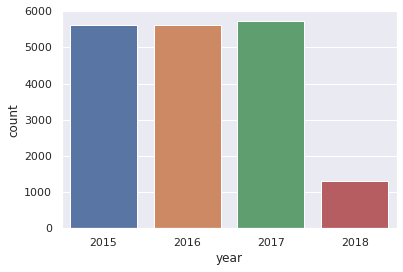

In [ ]:
sns.countplot(df["year"])
print(df['year'].value_counts())

Avocado Sold in a year.

- 2017   - 5722
-2016   - 5616
-2015   - 5615
-2018   - 1296


conventional    9126
organic         9123
Name: type, dtype: int64


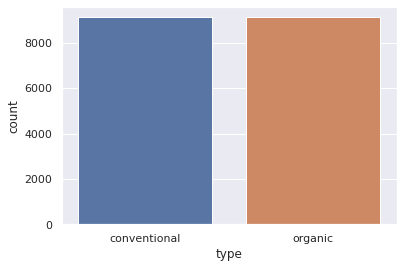

In [ ]:
sns.countplot(df["type"])
print(df['type'].value_counts())

Avocado Type
- conventional    - 9126
-organic         - 9123

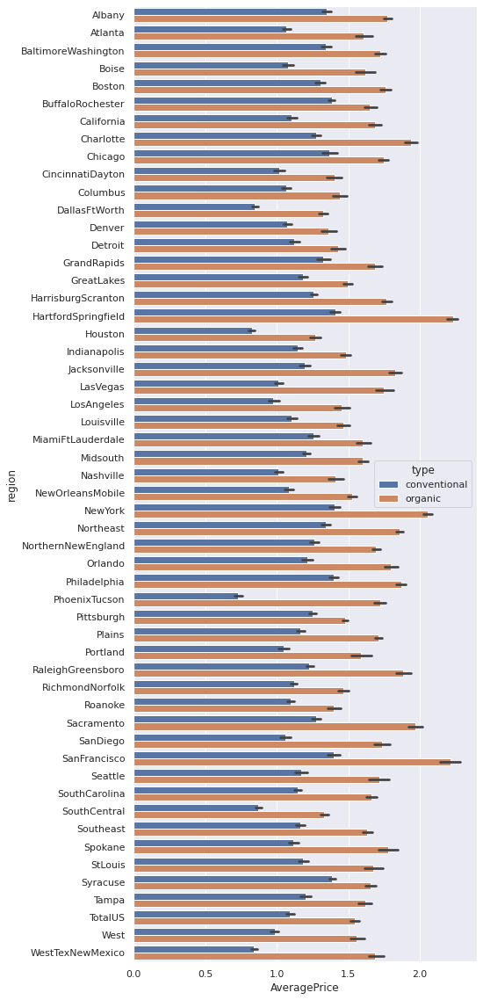

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["AveragePrice"],y=df["region"],hue=df['type'])

Conventional Type
- PhoneixTucson has lowest average price for convetional avocado type
- NewYork has highest average price for conventional avocado type

Organic Type
- Houston has lowest average price for organic avocado type
- San Francisco has highest average price for organic avocado type

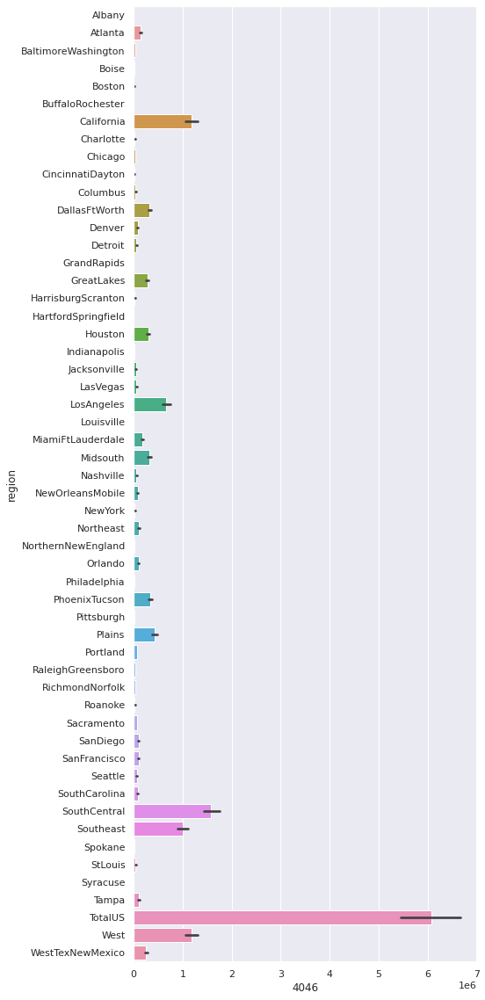

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["4046"],y=df["region"])

- TotalUS region has highest sale of 4046 type avocado

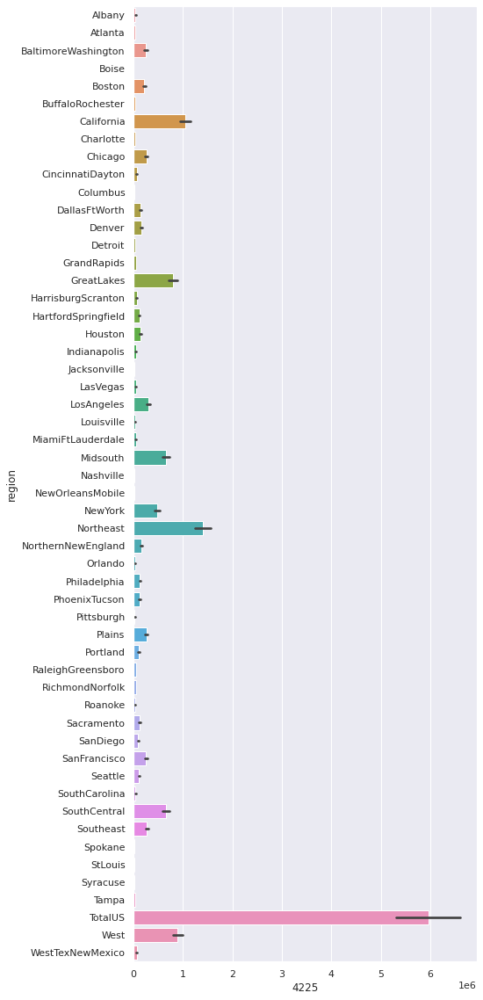

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["4225"],y=df["region"])

- TotalUS has highest sale of 4225 type avocado

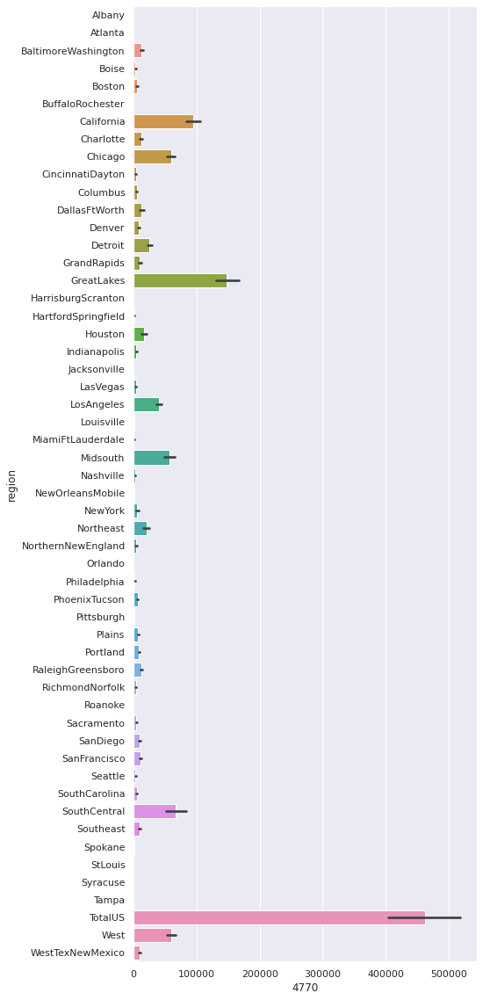

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["4770"],y=df["region"])

- TotalUS has highest sale of 4770 type avocado




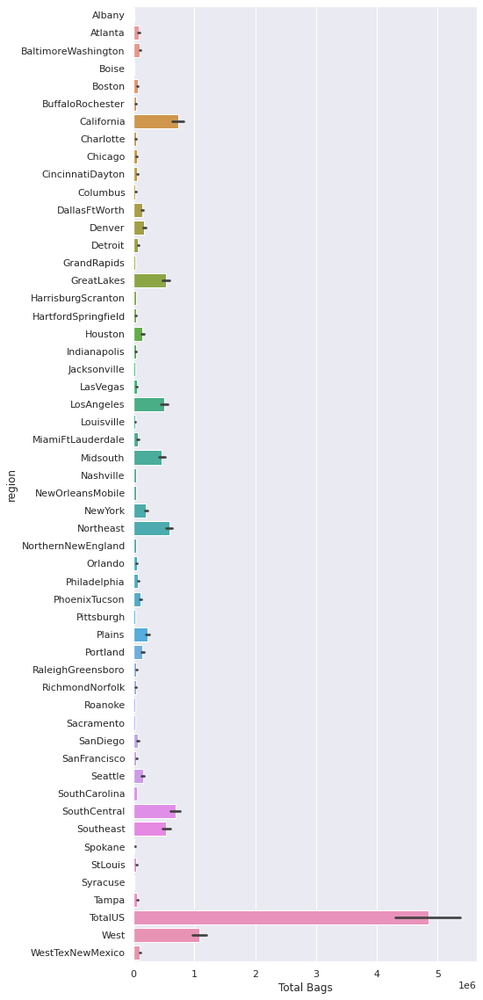

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["Total Bags"],y=df["region"])

- TotalUS region has highest sold Total Bags

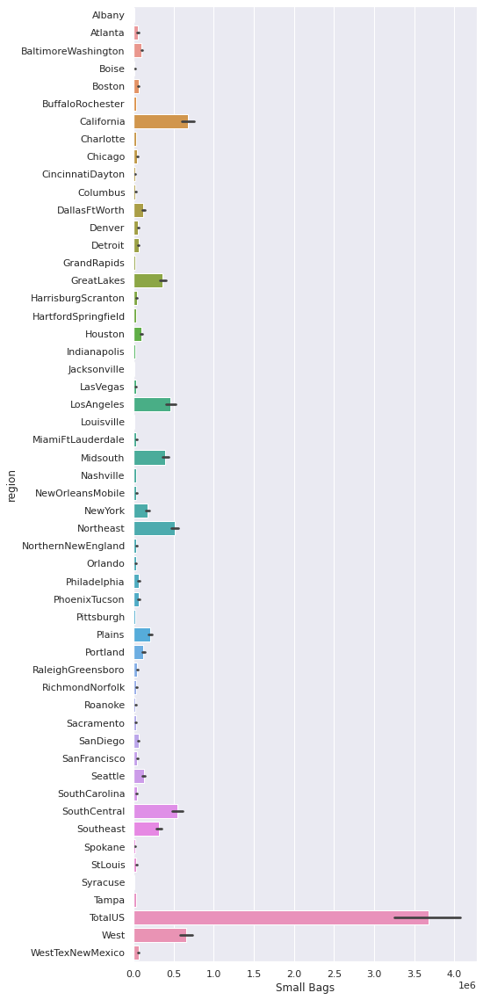

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["Small Bags"],y=df["region"])

- TotalUS region has highest sold Small Bags




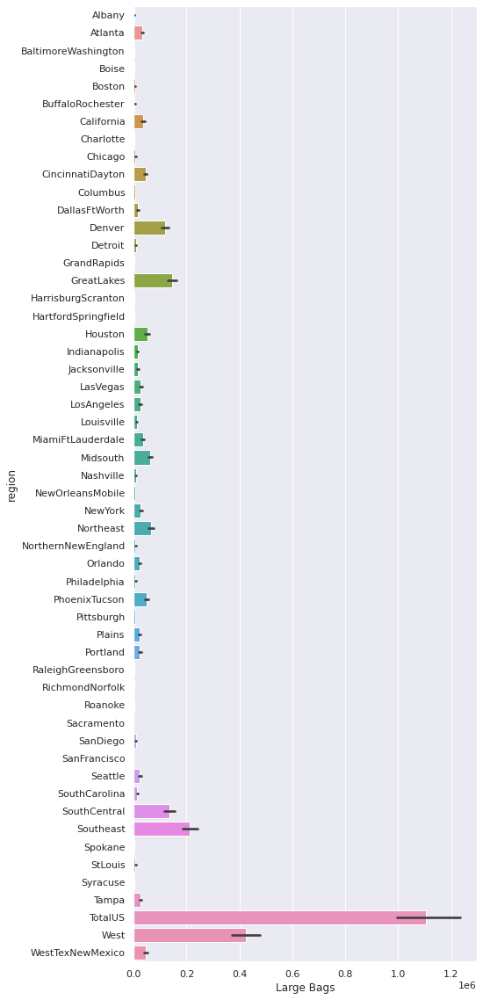

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["Large Bags"],y=df["region"])

- TotalUS region has highest sold Large Bags




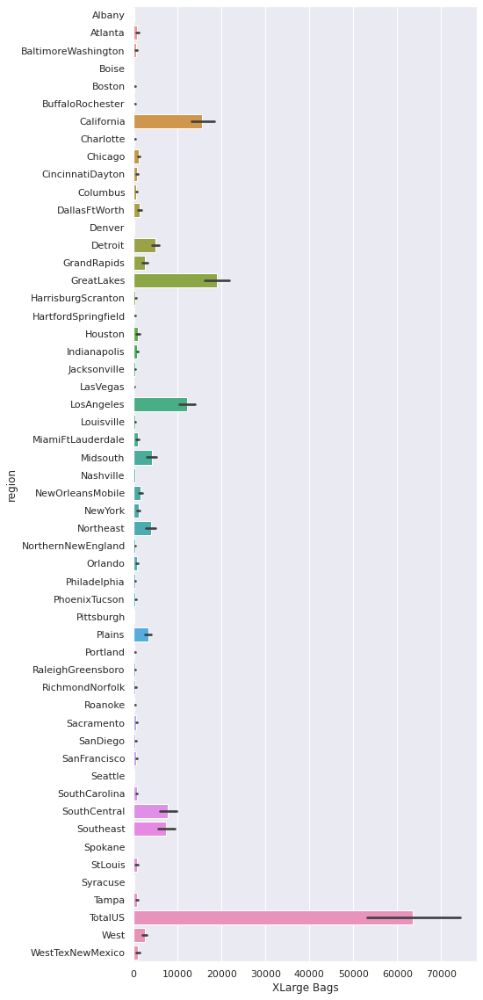

In [ ]:
plt.figure(figsize=(7,20))
sns.barplot(x=df["XLarge Bags"],y=df["region"])

- TotalUS region has highest sold XLarge Bags




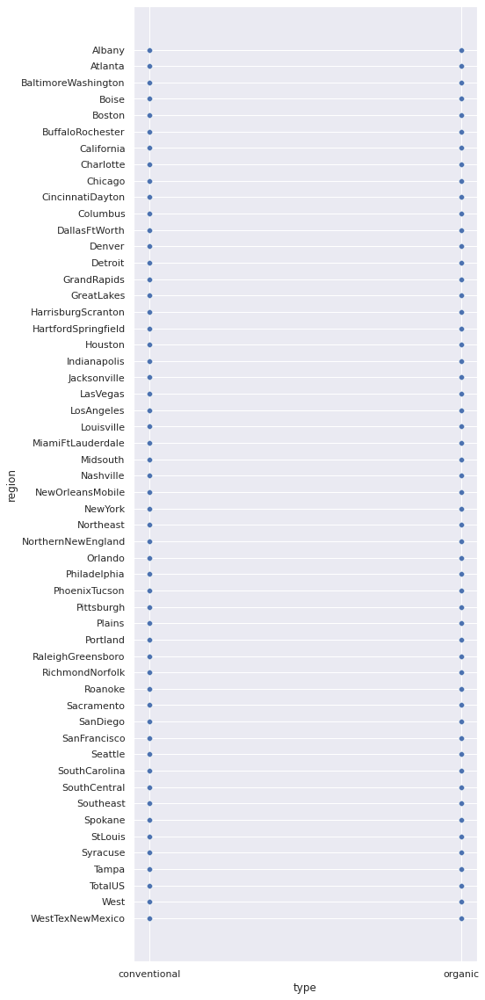

In [ ]:
plt.figure(figsize=(7,20))
sns.scatterplot(x=df["type"],y=df["region"])

Conventional and organic avocado are equally distributed between all region.

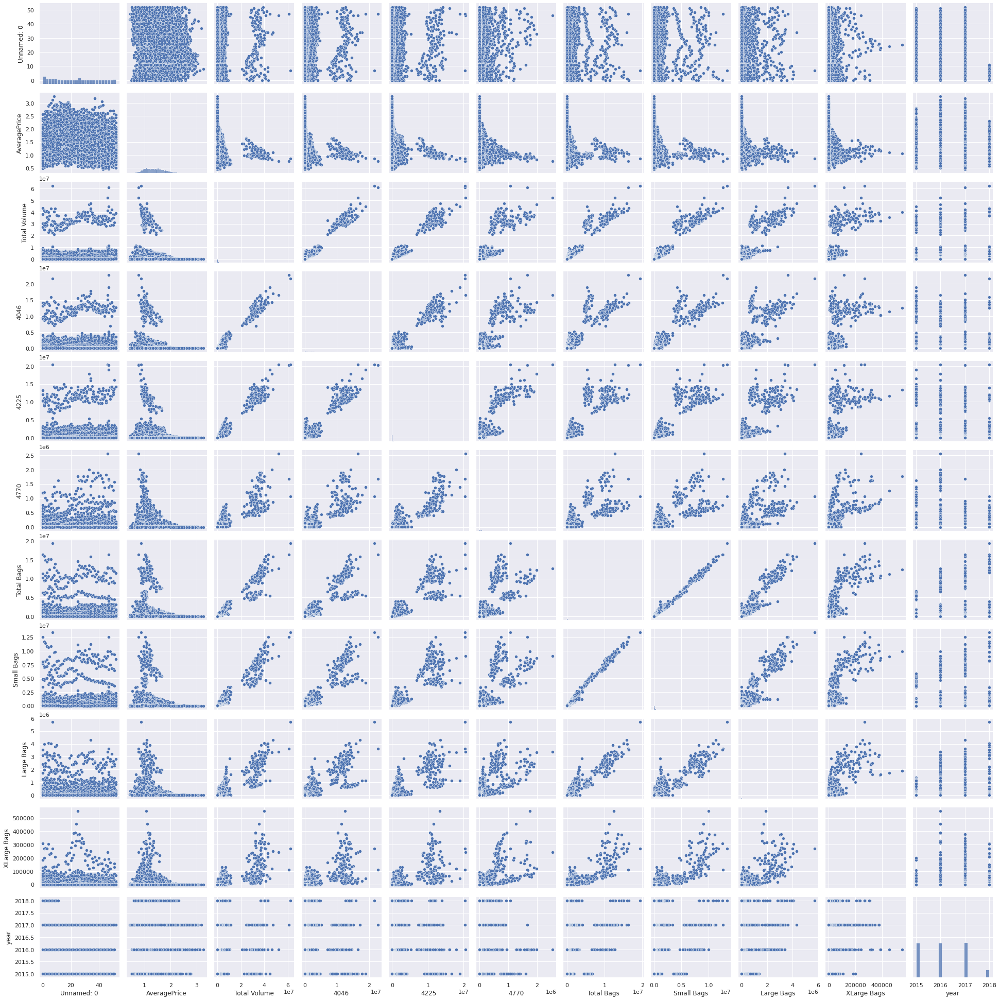

In [267]:
sns.pairplot(df)

# Describing Data

In [ ]:
df.describe()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,18249.000000,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000
mean,24.232232,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899
std,15.481045,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938
min,0.000000,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000
25%,10.000000,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000
50%,24.000000,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000
75%,38.000000,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000
max,52.000000,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000


- There is huge gap between 75% and Max value which indicates presence of outlier in some of the features.

- Data is widely spread in most of the features.

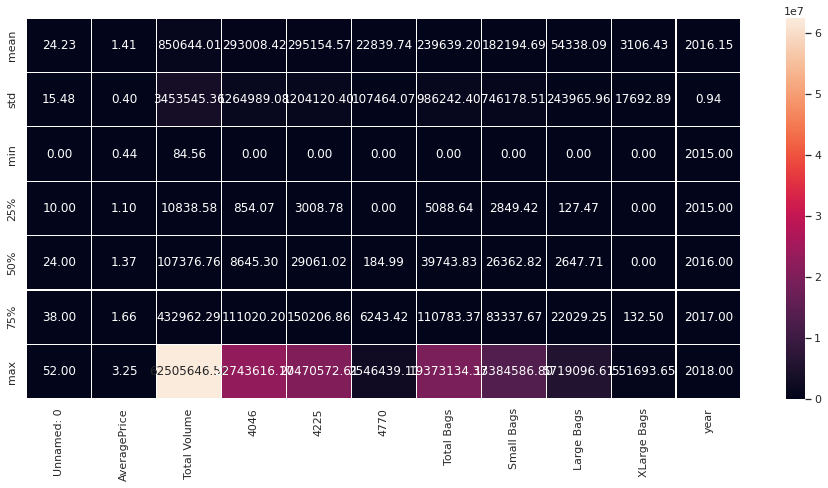

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(16,7))
sns.heatmap(df.describe()[1:],annot=True,linewidths=0.1,linecolor="White",fmt=".2f")

AveragePrice
- mean	- 24.232232	
-std -	15.481045	
-min -	0.000000	
-max -	52.000000

Total Volume	
- mean	- 1.405978
-std -	0.402677
-min -	0.440000
-max -	3.250000

4046
- mean	- 8.506440e+05
-std -	3.453545e+06	
-min -	8.456000e+01
-max -	6.250565e+07

4225	
- mean	- 2.930084e+05	
-std - 1.264989e+06	
-min -	0.000000e+00
-max -		2.274362e+07	

4770	
- mean	- 2.951546e+05
-std - 1.204120e+06
-min -	0.000000e+00
-max -	2.047057e+07

Total Bags	
- mean	- 	2.283974e+04	
-std -	1.074641e+05
-min -	0.000000e+00
-max -	2.546439e+06

Small Bags	
- mean	- 2.396392e+05	
-std -	9.862424e+05
-min -	0.000000e+00
-max -	1.937313e+07	

Large Bags
- mean	- 1.821947e+05
-std -	7.461785e+05
-min -	0.000000e+00
-max -	1.338459e+07	

XLarge 
- mean	- 5.433809e+04
-std -	2.439660e+05
-min -	0.000000e+00	
-max -	5.719097e+06

Bags	
- mean	- 3106.426507	
-std -	17692.894652
-min -	0.000000e+00
-max - 551693.650000	

year
- mean	- 2016.147899
-std -	0.939938
-min -	2015.000000
-max -	2018.000000


# Encoding

In [208]:
from sklearn.preprocessing import LabelEncoder 
list_encode = ['Date','region','type','year']
le = LabelEncoder()
for i in list_encode:
    df[i] = le.fit_transform(df[i])

In [209]:
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,53,1.33,72930,1036,54454,48,8696,8603,93,0,0,0,0
1,1,50,1.35,64380,674,44638,58,9505,9408,97,0,0,0,0
2,2,47,0.93,126363,794,109149,130,8145,8042,103,0,0,0,0
3,3,57,1.08,84801,1132,71976,72,5811,5677,133,0,0,0,0
4,4,41,1.28,57220,941,43838,75,6183,5986,197,0,0,0,0


# Checking Correlation with Region as target column.

In [210]:
import matplotlib.pyplot as plt 
import seaborn as sns

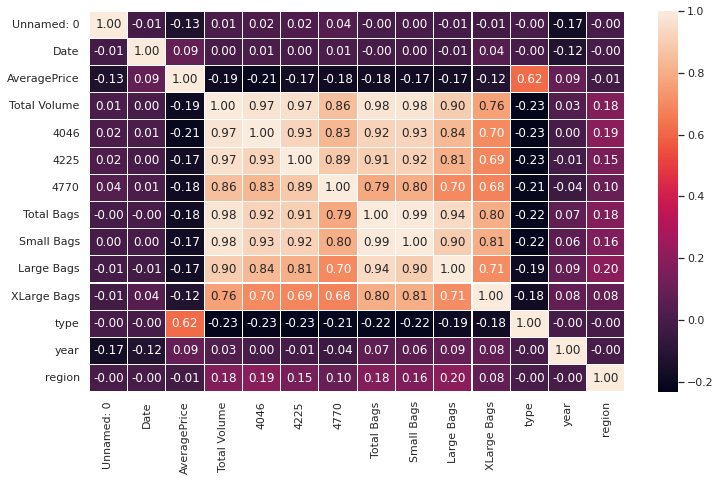

In [211]:

plt.figure(figsize=(12,7))
sns.heatmap(df.corr(),annot=True,linewidths=0.1,linecolor="White",fmt=".2f")


- Date has no correlation with target column.

- AveragePrice has -1 percent correlation with target column which is considered as a very weak -ve bond.

- Total Volume has 17 percent correlation with target column which is considered as a very weak +ve bond.

- 4046 PLU has 19 percent correlation with target column which is considered as a very weak +ve bond.

- 4225 PLU has 15 percent correlation with target column which is considered as a very weak +ve bond.

- 4770 PLU PLU has 10 percent correlation with target column which is considered as a very weak +ve bond.

- Total Bags has 18 percent correlation with target column which is considered as a very weak +ve bond.

- Small Bags has 16 percent correlation with target column which is considered as a very weak +ve bond.

- Large Bags has 20 percent correlation with target column which is considered as a weak +ve bond.

- XLarge Bags has 8 percent correlation with target column which is considered as a very weak +ve bond.

- Type has no correlation with target column .

- Year has no correlation with target column.





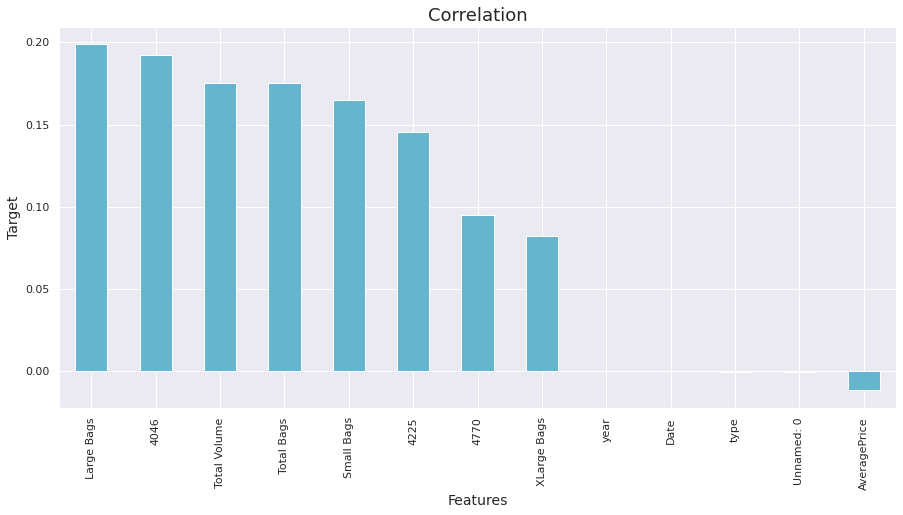

In [212]:
plt.figure(figsize=(15,7))
df.corr()['region'].sort_values(ascending=False).drop(['region']).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()


- Max -ve correlation : AveragePrice
- Min -ve correlation : AveragePrice

- Max +ve correlation : Large Bags
- Min +ve correlation : XLarge Bags

# Checking Outliers

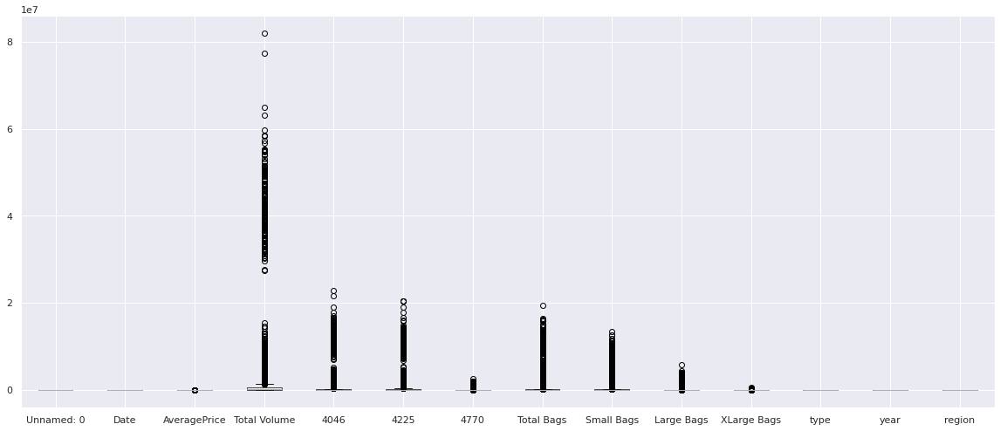

In [213]:
import matplotlib.pyplot as plt
df.iloc[:,0:14].boxplot(figsize=(20,8))
plt.subplots_adjust(bottom=0.1)
plt.show()

- AveragePrice,	Total Volume,	4046,	4225,	4770,	Total Bags,	Small Bags,	Large Bags,	XLarge Bags	features have outlier.

In [214]:
new_df_cap = df.copy()

In [215]:
def remove_outliers(n):
    Q1 = np.percentile(df[n], 25, interpolation = 'midpoint')  
    Q3 = np.percentile(df[n], 75, interpolation = 'midpoint') 
    iqr = Q3 - Q1 
    percentile25 = df[n].quantile(0.25)
    percentile75 = df[n].quantile(0.75)
    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr
    df[df[n] > upper_limit]
    df[df[n] < lower_limit]
    
    new_df = df[df[n] < upper_limit]
    new_df.shape
    
    new_df_cap[n] = np.where(
    new_df_cap[n] > upper_limit,
    upper_limit,
    np.where(
        new_df_cap[n] < lower_limit,
        lower_limit,
        new_df_cap[n] ) )
    
    sns.boxplot(new_df_cap[n])
    

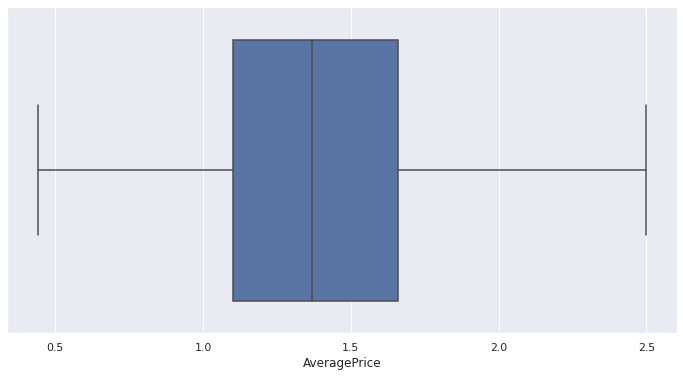

In [216]:
remove_outliers("AveragePrice")

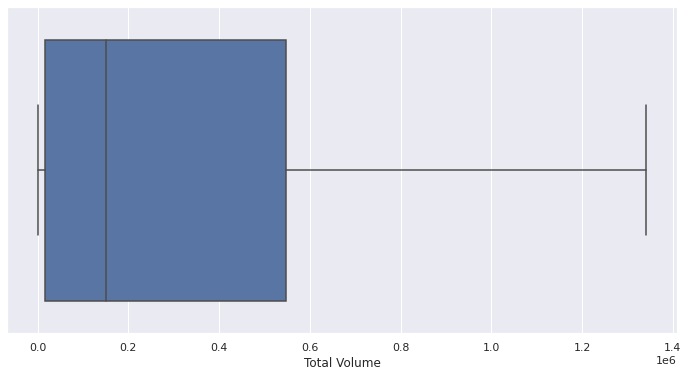

In [217]:
remove_outliers("Total Volume")

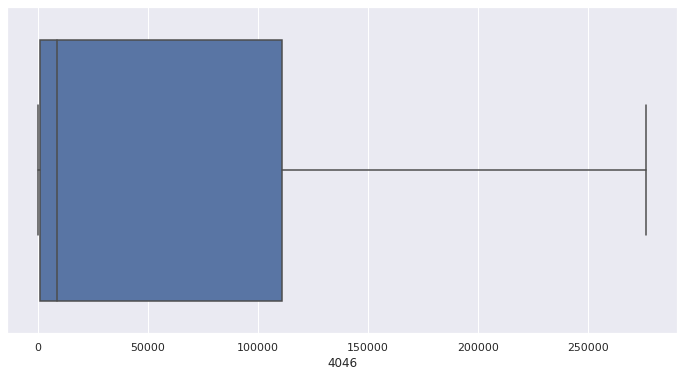

In [218]:
remove_outliers("4046")

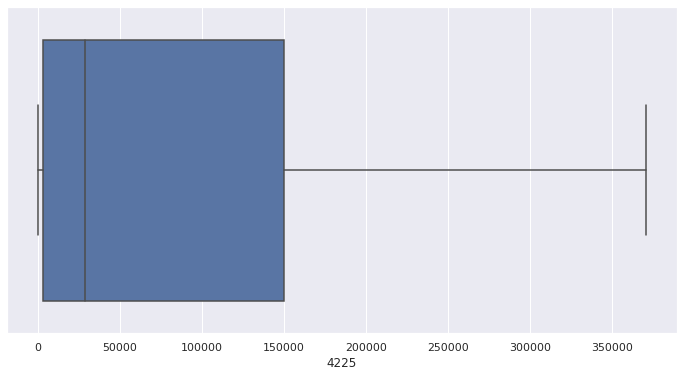

In [219]:
remove_outliers("4225")

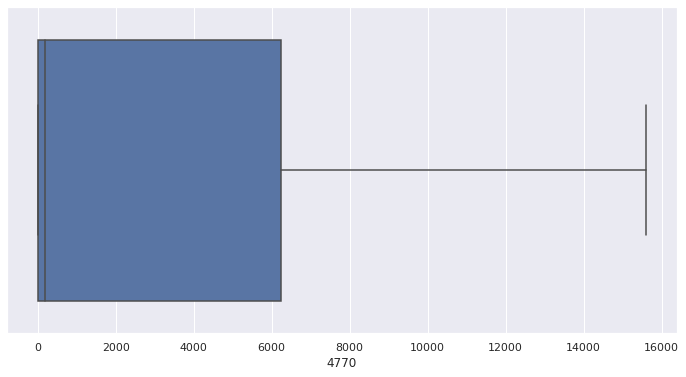

In [220]:
remove_outliers("4770")

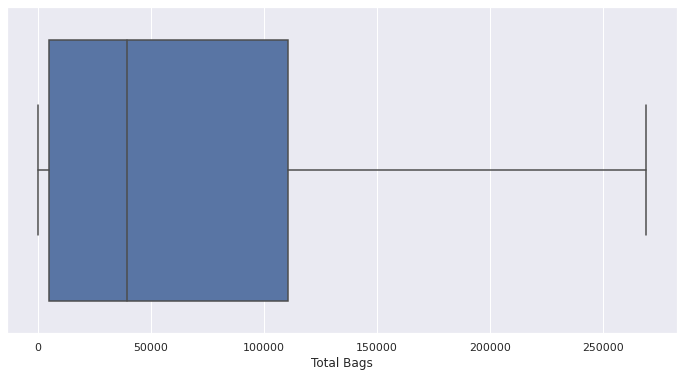

In [221]:
remove_outliers("Total Bags")

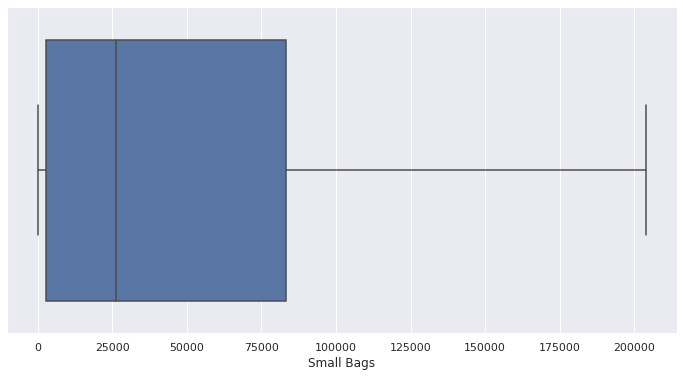

In [222]:
remove_outliers("Small Bags")

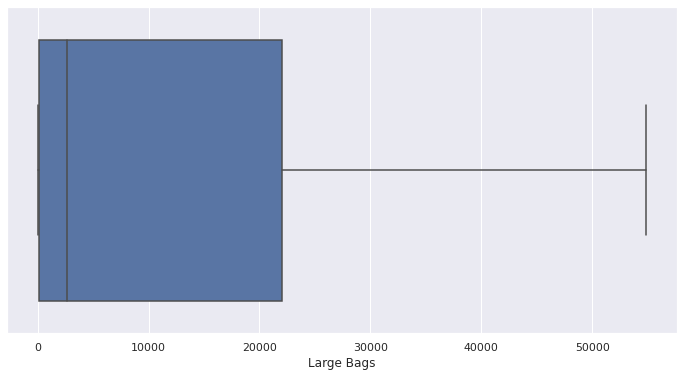

In [223]:
remove_outliers("Large Bags")

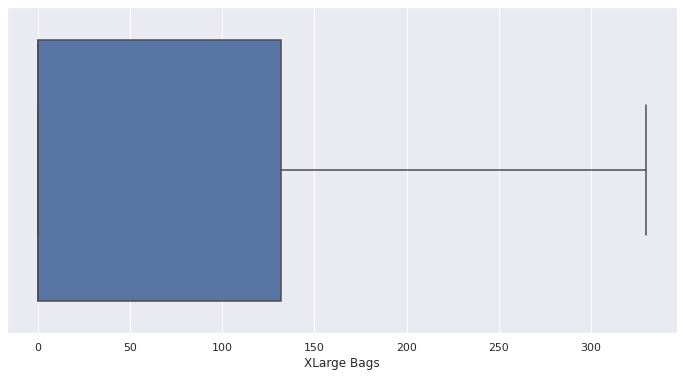

In [224]:
remove_outliers("XLarge Bags")

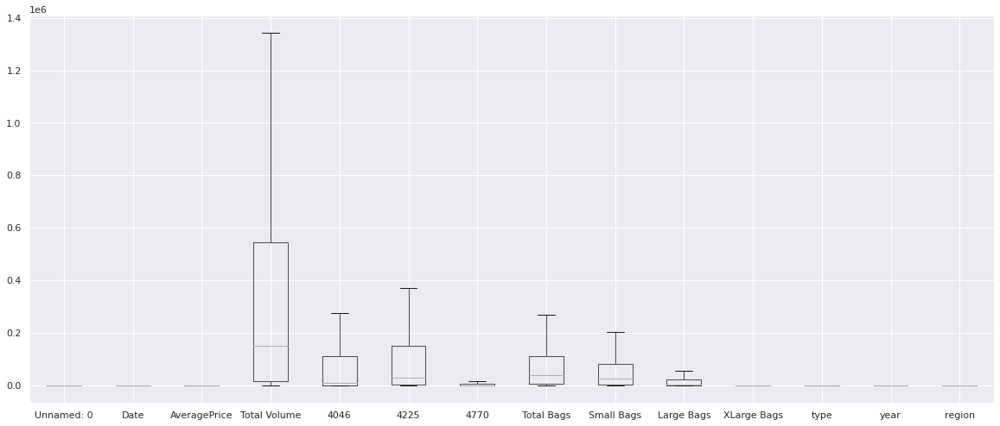

In [225]:
import matplotlib.pyplot as plt
new_df_cap.iloc[:,0:14].boxplot(figsize=(20,8))
plt.subplots_adjust(bottom=0.1)
plt.show()

# Separating features and target data (Region)

In [226]:
new_df_cap["Day"]=days
new_df_cap["Month"]=months

x=new_df_cap.drop(["Date","region","Unnamed: 0",],axis=1)

list2=["Day","Month"]
for i in list2:
  x[i]=x[i].astype(int)

x.head()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,Day,Month
0,1.33,72930.0,1036.0,54454.0,48.0,8696.0,8603.0,93.0,0.0,0,0,27,12
1,1.35,64380.0,674.0,44638.0,58.0,9505.0,9408.0,97.0,0.0,0,0,20,12
2,0.93,126363.0,794.0,109149.0,130.0,8145.0,8042.0,103.0,0.0,0,0,13,12
3,1.08,84801.0,1132.0,71976.0,72.0,5811.0,5677.0,133.0,0.0,0,0,6,12
4,1.28,57220.0,941.0,43838.0,75.0,6183.0,5986.0,197.0,0.0,0,0,29,11


- Since Year column already existed, we extracted day and month from Date column and then dropped Date column. 
- Converting Day and Month columns from object type to int type.

In [227]:
y=new_df_cap["region"]
y

0         0
1         0
2         0
3         0
4         0
         ..
18244    53
18245    53
18246    53
18247    53
18248    53
Name: region, Length: 18249, dtype: int64

# Detecting Skewness

In [228]:
x.skew().sort_values()

type            0.000329
Day             0.014310
Month           0.106617
year            0.215339
AveragePrice    0.453073
Total Bags      1.158552
XLarge Bags     1.175318
Small Bags      1.186101
Total Volume    1.188577
4770            1.212180
Large Bags      1.215312
4225            1.219270
4046            1.251185
dtype: float64

Keeping +/-0.5 as the range for skewness we can see following have skewness
- Total Bags    
-XLarge Bags  
-Small Bags     
-Total Volume    
-4770            
-Large Bags      
-4225            
-4046           


Text(0, 0.5, 'XLarge Bags')

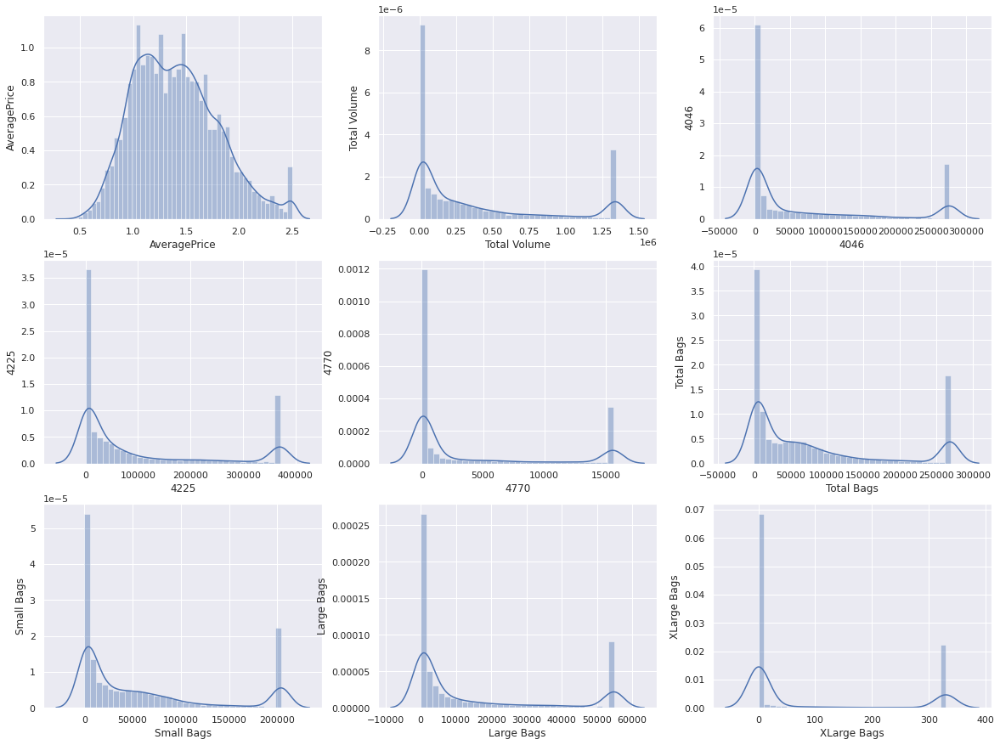

In [229]:
import matplotlib.pyplot as plt
sns.set()
fig, axes = plt.subplots(3, 3,figsize=(20, 15))

sns.distplot(x["AveragePrice"],ax=axes[0,0])
axes[0,0].set_ylabel("AveragePrice")

sns.distplot(x["Total Volume"],ax=axes[0,1])
axes[0,1].set_ylabel("Total Volume")

sns.distplot(x["4046"],ax=axes[0,2])
axes[0,2].set_ylabel("4046")

sns.distplot(x["4225"],ax=axes[1,0])
axes[1,0].set_ylabel("4225")

sns.distplot(x["4770"],ax=axes[1,1])
axes[1,1].set_ylabel("4770")

sns.distplot(x["Total Bags"],ax=axes[1,2])
axes[1,2].set_ylabel("Total Bags")

sns.distplot(x["Small Bags"],ax=axes[2,0])
axes[2,0].set_ylabel("Small Bags")

sns.distplot(x["Large Bags"],ax=axes[2,1])
axes[2,1].set_ylabel("Large Bags")

sns.distplot(x["XLarge Bags"],ax=axes[2,2])
axes[2,2].set_ylabel("XLarge Bags")




All the columns except average price are of discrete data type.

In [230]:
from sklearn.preprocessing import power_transform
new=power_transform(x)
X2=pd.DataFrame(new)
X2.head()


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.094667,-0.254383,-0.736803,0.347133,-0.284560,-0.637276,-0.439952,-0.864326,-0.706258,-0.999836,-1.308421,1.229285,1.494347
1,-0.042083,-0.315475,-0.853802,0.252378,-0.236870,-0.597392,-0.400875,-0.855181,-0.706258,-0.999836,-1.308421,0.541005,1.494347
2,-1.274312,0.024469,-0.809839,0.700806,-0.029767,-0.666240,-0.468971,-0.842052,-0.706258,-0.999836,-1.308421,-0.215570,1.494347
3,-0.800713,-0.179442,-0.712012,0.484785,-0.181949,-0.810576,-0.613022,-0.784860,-0.706258,-0.999836,-1.308421,-1.091311,1.494347
4,-0.228492,-0.372518,-0.763446,0.243890,-0.171531,-0.784675,-0.591714,-0.692853,-0.706258,-0.999836,-1.308421,1.416727,1.278438


Text(0, 0.5, '')

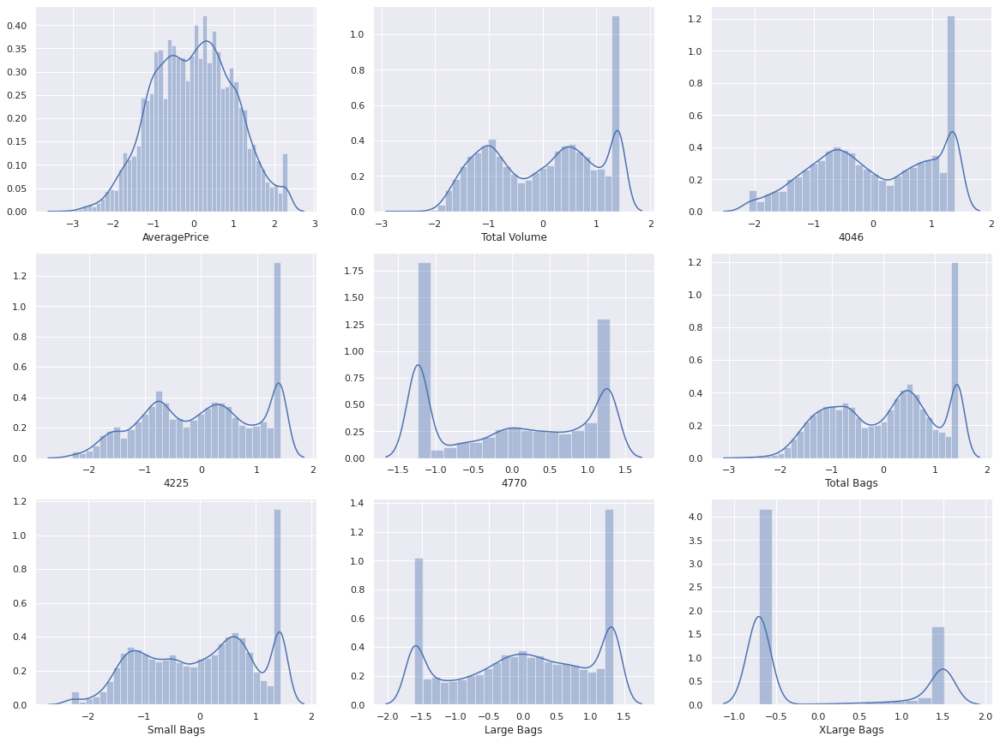

In [231]:
import matplotlib.pyplot as plt
sns.set()
fig, axes = plt.subplots(3, 3,figsize=(20, 15))

sns.distplot(X2.iloc[:,0],ax=axes[0,0])
axes[0,0].set_xlabel("AveragePrice")
axes[0,0].set_ylabel("")

sns.distplot(X2.iloc[:,1],ax=axes[0,1])
axes[0,1].set_xlabel("Total Volume")
axes[0,1].set_ylabel("")

sns.distplot(X2.iloc[:,2],ax=axes[0,2])
axes[0,2].set_xlabel("4046")
axes[0,2].set_ylabel("")

sns.distplot(X2.iloc[:,3],ax=axes[1,0])
axes[1,0].set_xlabel("4225")
axes[1,0].set_ylabel("")

sns.distplot(X2.iloc[:,4],ax=axes[1,1])
axes[1,1].set_xlabel("4770")
axes[1,1].set_ylabel("")

sns.distplot(X2.iloc[:,5],ax=axes[1,2])
axes[1,2].set_xlabel("Total Bags")
axes[1,2].set_ylabel("")

sns.distplot(X2.iloc[:,6],ax=axes[2,0])
axes[2,0].set_xlabel("Small Bags")
axes[2,0].set_ylabel("")

sns.distplot(X2.iloc[:,7],ax=axes[2,1])
axes[2,1].set_xlabel("Large Bags")
axes[2,1].set_ylabel("")

sns.distplot(X2.iloc[:,8],ax=axes[2,2])
axes[2,2].set_xlabel("XLarge Bags")
axes[2,2].set_ylabel("")



After transformation
- All graphs except average price are of discrete data type

0.6986629936394456

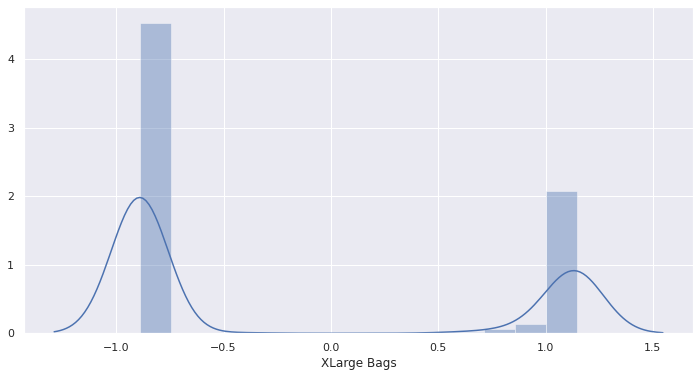

In [232]:
import matplotlib.pyplot as plt

a=np.cbrt(X2.iloc[:,8])
b=sns.distplot(a)
b.set(xlabel='XLarge Bags',ylabel= '')
a.skew()

- After performing mutliple transformation technique on XLarge Bags, it has been observed that the skewness cannot be reduced beyond 0.69. 

- After looking at correlation matrix, it has been observed that XLarge Bags contribution towards target data is least among all the features and hence we drop the column.

In [233]:
X2=X2.drop(X2.iloc[:,8:9],axis=1)
X2.skew().sort_values()

7    -0.213805
11   -0.208462
6    -0.165353
12   -0.146584
3    -0.135974
5    -0.130538
2    -0.123172
10   -0.091946
1    -0.090257
4    -0.045202
9     0.000329
0     0.004467
dtype: float64

# Detecting Collinearity

In [234]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [235]:
calc_vif(X2)

,variables,VIF
0,0,2.370873
1,1,75.082138
2,2,6.272061
3,3,12.133464
4,4,3.954753
5,5,54.434689
6,6,21.631479
7,7,3.719209
8,9,4.007404
9,10,1.449546


Here are columns having VIF>5, indicating presence of collinearity
- column 1 
- column 2 
- column 3 
-column 5 
-column 6 



In [236]:
X=X2.drop(X2.iloc[:,1:2],axis=1)
X=X.drop(X2.iloc[:,6:7],axis=1)
calc_vif(X)

,variables,VIF
0,0,2.183800
1,2,3.741328
2,3,4.928402
3,4,3.877895
4,5,7.334796
5,7,2.257466
6,9,3.917643
7,10,1.449419
8,11,1.002343
9,12,1.130688


The above table indicates that collinearity has been completely removed.

# Oversampling

In [237]:
y.value_counts()

0     338
40    338
29    338
30    338
31    338
32    338
33    338
34    338
35    338
36    338
37    338
38    338
39    338
41    338
1     338
42    338
43    338
44    338
45    338
46    338
47    338
48    338
49    338
50    338
51    338
52    338
28    338
27    338
26    338
25    338
2     338
3     338
4     338
5     338
6     338
7     338
8     338
9     338
10    338
11    338
12    338
13    338
14    338
15    338
16    338
17    338
18    338
19    338
20    338
21    338
22    338
23    338
24    338
53    335
Name: region, dtype: int64

The Region labelled "53" has 335 when compared to rest labell that are equally divided in 338 count each.

In [238]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x_new, y_new = sm.fit_resample(X, y)

In [239]:
y_new.value_counts()

0     338
40    338
29    338
30    338
31    338
32    338
33    338
34    338
35    338
36    338
37    338
38    338
39    338
41    338
1     338
42    338
43    338
44    338
45    338
46    338
47    338
48    338
49    338
50    338
51    338
52    338
28    338
27    338
26    338
25    338
2     338
3     338
4     338
5     338
6     338
7     338
8     338
9     338
10    338
11    338
12    338
13    338
14    338
15    338
16    338
17    338
18    338
19    338
20    338
21    338
22    338
23    338
24    338
53    338
Name: region, dtype: int64

In [240]:
y=y_new

# Traning and Testing

In [241]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split


mns=MinMaxScaler()
s=mns.fit_transform(x_new)
xs=pd.DataFrame(data=s)
print(xs)

              0         1         2         3         4         5    6  \
0      0.561737  0.392886  0.713295  0.377251  0.495850  0.252222  0.0   
1      0.571278  0.359383  0.687877  0.396089  0.505513  0.255322  0.0   
2      0.347683  0.371972  0.808164  0.477894  0.488832  0.259774  0.0   
3      0.433620  0.399985  0.750219  0.417782  0.453860  0.279165  0.0   
4      0.537453  0.385256  0.685600  0.421897  0.460136  0.310361  0.0   
...         ...       ...       ...       ...       ...       ...  ...   
18247  0.812498  0.424463  0.405399  0.658818  0.521390  0.208668  1.0   
18248  0.691413  0.479423  0.385658  0.534204  0.531680  0.167013  1.0   
18249  0.840906  0.416088  0.413136  0.000000  0.363440  0.309336  1.0   
18250  0.681106  0.534414  0.425743  0.000000  0.370857  0.437820  1.0   
18251  0.560580  0.431694  0.473627  0.362072  0.484461  0.256755  1.0   

              7         8         9  
0      0.000000  0.893704  1.000000  
1      0.000000  0.696739  1.000000

# PCA

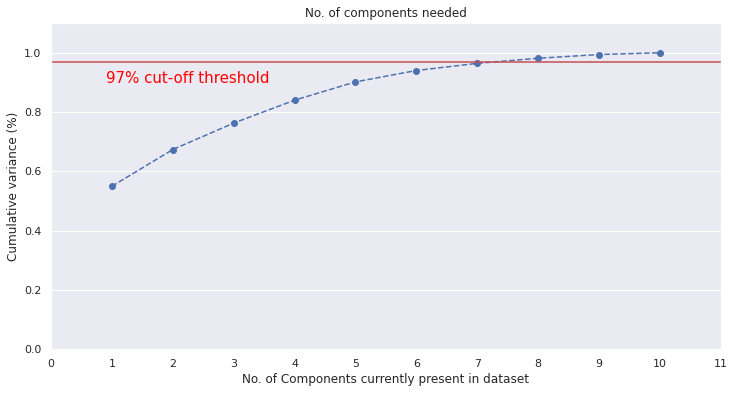

In [242]:
from sklearn.decomposition import PCA
pca = PCA().fit(xs)

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
a = np.arange(1, 11, step=1)
b = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(a, b, marker='o', linestyle='--', color='b')

plt.xlabel('No. of Components currently present in dataset')
plt.xticks(np.arange(0, 12, step=1))
plt.ylabel('Cumulative variance (%)')
plt.title('No. of components needed')

plt.axhline(y=0.97, color='r', linestyle='-')
plt.text(0.90, 0.90, '97% cut-off threshold', color = 'red', fontsize=15)
ax.grid(axis='x')
plt.show()

In [243]:
pca = PCA(n_components = 7)
pca.fit(xs)
x = pca.transform(xs)
x.shape

(18252, 7)

#Training

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
lg=LogisticRegression()

In [ ]:
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lg.fit(x_train,y_train)
    pred_train=lg.predict(x_train)
    pred_test=lg.predict(x_test)
    if  round(accuracy_score(y_train,pred_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("At random state",i)
        print("training accuracy: ",round(accuracy_score(y_train,pred_train)))
        print("testing accuracy:", round(accuracy_score(y_test,pred_test)))
        print("\n")
       

At random state 41
training accuracy:  0
testing accuracy: 0




In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=99)
lg.fit(x_train,y_train) 
pred_train=lg.predict(x_train)
pred_test=lg.predict(x_test)
print("Train Accuracy:",accuracy_score(y_train,pred_train))

Train Accuracy: 0.24464077802890213


In [ ]:
print("Test Accuracy:",accuracy_score(y_test,pred_test))

Test Accuracy: 0.2336346206518762


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report
print("Classification report for test data\n",classification_report(y_test,pred_test))
print("Classification report for training data\n",classification_report(y_train,pred_train))
print("Confusion Matrix\n",confusion_matrix(y_test,pred_test))

Classification report for test data
               precision    recall  f1-score   support

           0       0.22      0.43      0.29        61
           1       0.25      0.64      0.36        75
           2       0.36      0.77      0.50        66
           3       0.27      0.06      0.10        69
           4       0.12      0.04      0.06        69
           5       0.08      0.04      0.06        67
           6       0.33      0.57      0.42        63
           7       0.39      0.54      0.45        69
           8       0.00      0.00      0.00        77
           9       0.22      0.53      0.31        66
          10       0.10      0.10      0.10        62
          11       0.30      0.25      0.27        75
          12       0.10      0.07      0.08        70
          13       0.02      0.02      0.02        58
          14       0.34      0.42      0.38        57
          15       0.21      0.34      0.26        56
          16       0.12      0.05      0.07 

In [ ]:
pred_lg=lg.predict(x_test)
lss=accuracy_score(y_test,pred_lg)

from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lg,x,y,cv=j)
    print(cv_score)
    cv_mean=cv_score.mean()
    print("At cv:",j)
    print("cv score is ",cv_mean*100)
    print("accuracy is", lss*100)
    print("\n")

[0.02016217 0.01851852]
At cv: 2
cv score is  1.9340346263423187
accuracy is 23.36346206518762


[0.09812623 0.17735043 0.18573307]
At cv: 3
cv score is  15.373657681349991
accuracy is 23.36346206518762


[0.13609467 0.1268902  0.19986851 0.19088319]
At cv: 4
cv score is  16.3434144203375
accuracy is 23.36346206518762


[0.15502602 0.15036976 0.20109589 0.2339726  0.19561644]
At cv: 5
cv score is  18.721614269687795
accuracy is 23.36346206518762


[0.16042078 0.17159763 0.1416831  0.20151216 0.23109796 0.22649573]
At cv: 6
cv score is  18.88012272627657
accuracy is 23.36346206518762


[0.16679448 0.18021472 0.16334356 0.19677791 0.24894515 0.20828539
 0.24817798]
At cv: 7
cv score is  20.179131170142274
accuracy is 23.36346206518762


[0.17134093 0.19675723 0.17572305 0.14548642 0.228847   0.26391933
 0.20473477 0.25602806]
At cv: 8
cv score is  20.535459734629054
accuracy is 23.36346206518762


[0.17504931 0.20069034 0.17998028 0.1770217  0.17504931 0.24063116
 0.24704142 0.20710059 0

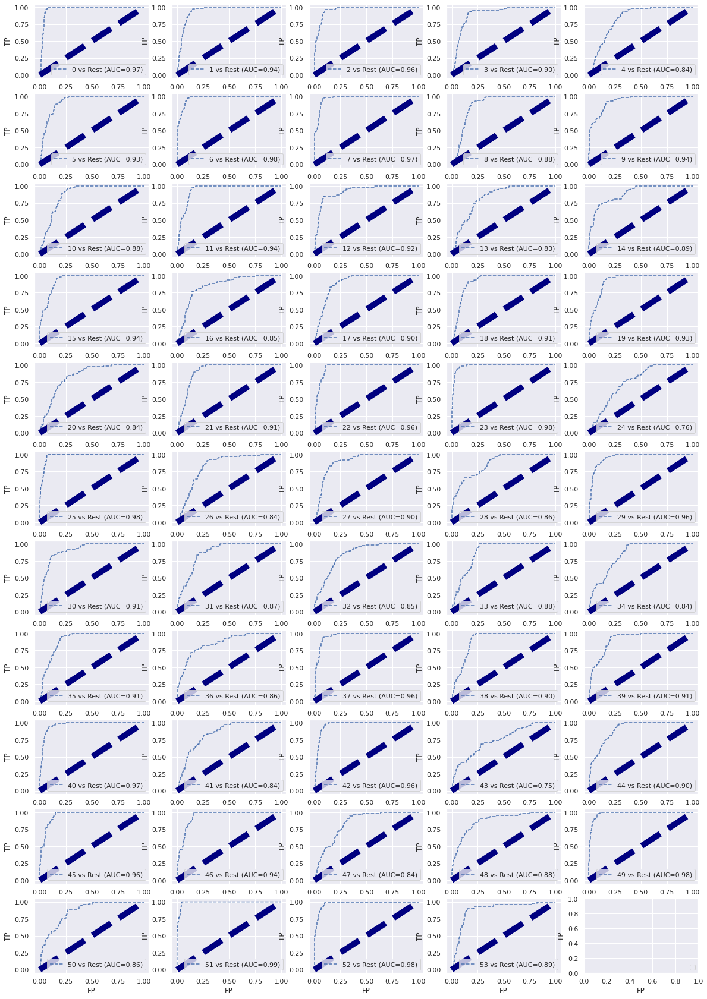

In [ ]:
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve,auc
lg=LogisticRegression()
lg.fit(x_train,y_train)
pred=lg.predict_proba(x_test)
classes=np.unique(y_test)

y_test_binarized=label_binarize(y_test,classes=np.unique(y_test))
fpr={}
tpr={}
thresh={}
roc_auc=dict()

n_class=classes.shape[0]

sns.set()
fig, axes = plt.subplots(11, 5,figsize=(20, 30))
j=0
k=0
for i in range(n_class):
  fpr[i],tpr[i],thresh[i]=roc_curve(y_test_binarized[:,i],pred[:,i])
  roc_auc[i]=auc(fpr[i],tpr[i])
  if j<5:
    axes[k,j].plot(fpr[i],tpr[i],linestyle='--',label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))
    axes[k,j].plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
    j=j+1
  else:
    j=0
    k=k+1
    axes[k,j].plot(fpr[i],tpr[i],linestyle='--',label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))
    axes[k,j].plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
    j=1
  
for ax in axes.flat:
    ax.set(xlabel='FP', ylabel='TP')
    ax.legend(loc='lower right')
plt.show()

- Region labelled 51 has highest AUC=0.99
- Region labelled 13 has lowest AUC=0.83

#Model Selection

In [244]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error,mean_squared_error
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve,auc
def model_selection(algorithm_instance,x_train,y_train,x_test,y_test):
    algorithm_instance.fit(x_train,y_train)
    model_pred_train=algorithm_instance.predict(x_train)
    model_pred_test=algorithm_instance.predict(x_test)
    print("Accuracy of training model :",accuracy_score(y_train,model_pred_train))
    print("Accuracy of test data :",accuracy_score(y_test,model_pred_test))
    cv_score=cross_val_score(algorithm_instance,x,y,cv=5)
    cv_mean=cv_score.mean()
    print("cv score is ",cv_mean*100)
    print("\nClassification report for test data\n",classification_report(y_test,model_pred_test))
    print("Classification report for training data\n",classification_report(y_train,model_pred_train))
    print("Confusion Matrix\n",confusion_matrix(y_test,model_pred_test))
    

    pred=algorithm_instance.predict_proba(x_test)
    classes=np.unique(y_test)
    y_test_binarized=label_binarize(y_test,classes=np.unique(y_test))
    fpr={}
    tpr={}
    thresh={}
    roc_auc=dict()
    
    n_class=classes.shape[0]
    sns.set()
    fig, axes = plt.subplots(11, 5,figsize=(20, 30))
    j=0
    k=0
    for i in range(n_class):
      fpr[i],tpr[i],thresh[i]=roc_curve(y_test_binarized[:,i],pred[:,i])
      roc_auc[i]=auc(fpr[i],tpr[i])
      if j<5:
        axes[k,j].plot(fpr[i],tpr[i],linestyle='--',label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))
        axes[k,j].plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
        j=j+1
      else:
        j=0
        k=k+1
        axes[k,j].plot(fpr[i],tpr[i],linestyle='--',label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))
        axes[k,j].plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
        j=1
  
    for ax in axes.flat:
      ax.set(xlabel='FP', ylabel='TP')
      ax.legend(loc='lower right')
    plt.show()



#KNeighborsClassifier


Accuracy of training model : 0.5448256968700774
Accuracy of test data : 0.30621747466447546
cv score is  26.895697557058867

Classification report for test data
               precision    recall  f1-score   support

           0       0.24      0.48      0.32        61
           1       0.16      0.37      0.22        75
           2       0.37      0.70      0.48        66
           3       0.32      0.54      0.40        69
           4       0.17      0.28      0.21        69
           5       0.30      0.31      0.31        67
           6       0.16      0.46      0.24        63
           7       0.45      0.59      0.51        69
           8       0.20      0.34      0.25        77
           9       0.27      0.38      0.32        66
          10       0.14      0.21      0.17        62
          11       0.33      0.45      0.38        75
          12       0.24      0.41      0.31        70
          13       0.05      0.05      0.05        58
          14       0.40    

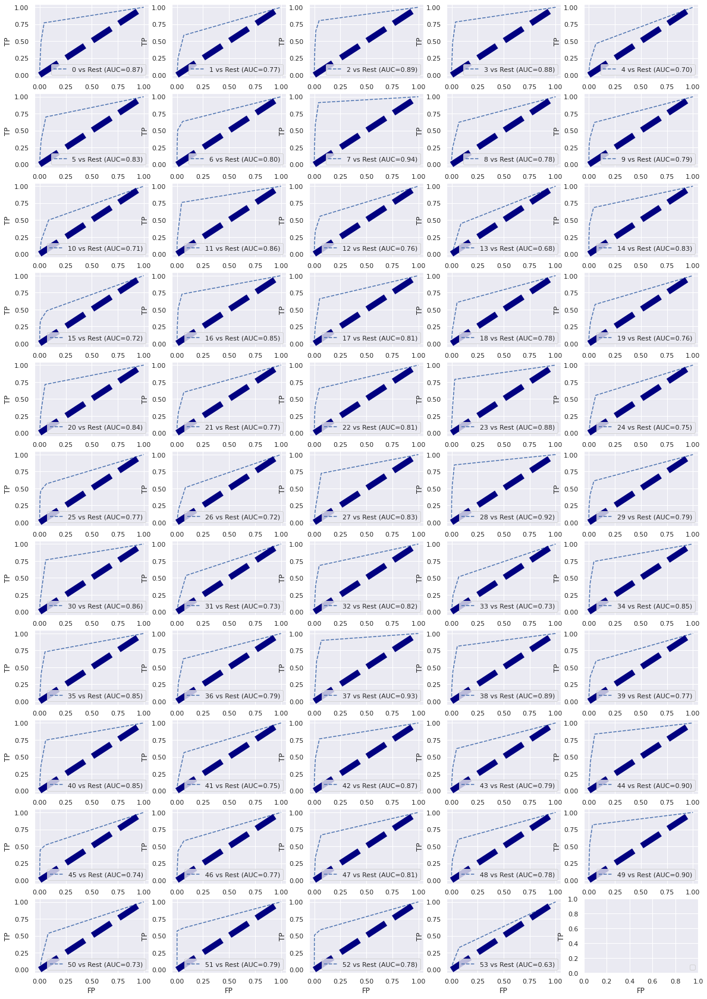

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

k=KNeighborsClassifier()
model_selection(k,x_train,y_train,x_test,y_test)

#SVM

Accuracy of training model : 0.49750017122114926
Accuracy of test data : 0.43385373870172556
cv score is  33.535963500335804

Classification report for test data
               precision    recall  f1-score   support

           0       0.33      0.75      0.46        61
           1       0.34      0.28      0.31        75
           2       0.54      0.80      0.64        66
           3       0.44      0.54      0.48        69
           4       0.41      0.25      0.31        69
           5       0.46      0.16      0.24        67
           6       0.70      0.49      0.58        63
           7       0.71      0.72      0.72        69
           8       0.51      0.48      0.49        77
           9       0.50      0.53      0.51        66
          10       0.22      0.40      0.28        62
          11       0.52      0.41      0.46        75
          12       0.41      0.36      0.38        70
          13       0.21      0.24      0.22        58
          14       0.57   

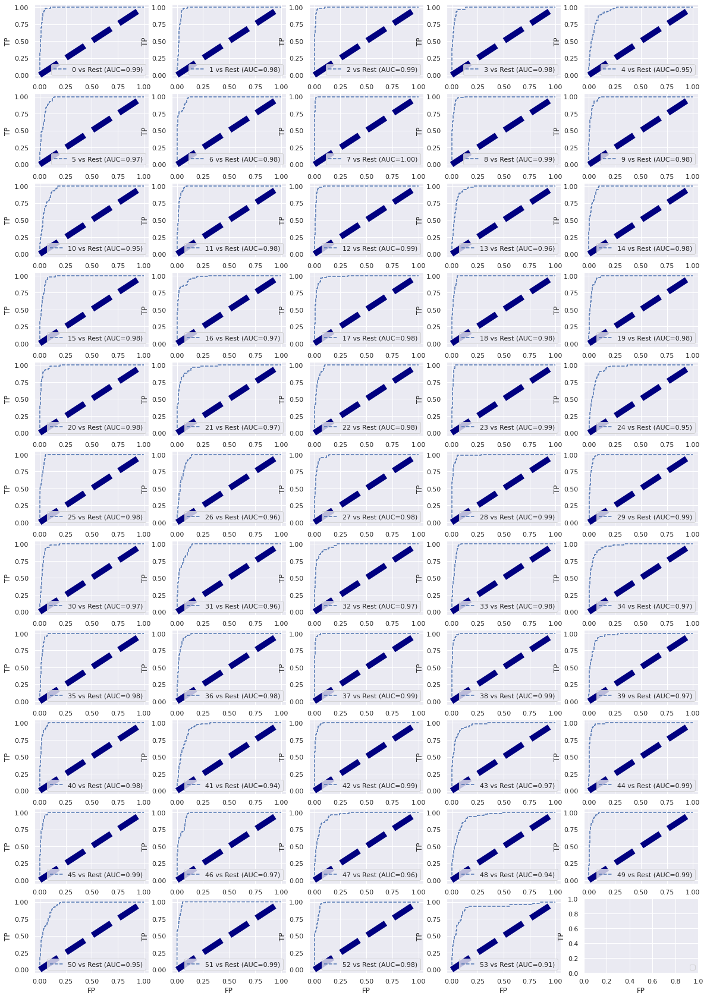

In [ ]:
from sklearn.svm import SVC
s=SVC(probability=True)
model_selection(s,x_train,y_train,x_test,y_test)

# DecisionTressClassifier Model

Accuracy of training model : 0.9980138346688583
Accuracy of test data : 0.5639550807997809
cv score is  28.572237292841518

Classification report for test data
               precision    recall  f1-score   support

           0       0.48      0.48      0.48        61
           1       0.52      0.55      0.53        75
           2       0.68      0.77      0.72        66
           3       0.53      0.54      0.53        69
           4       0.39      0.39      0.39        69
           5       0.65      0.61      0.63        67
           6       0.55      0.49      0.52        63
           7       0.81      0.70      0.75        69
           8       0.72      0.71      0.72        77
           9       0.54      0.62      0.58        66
          10       0.40      0.44      0.42        62
          11       0.61      0.65      0.63        75
          12       0.60      0.66      0.63        70
          13       0.47      0.47      0.47        58
          14       0.52     

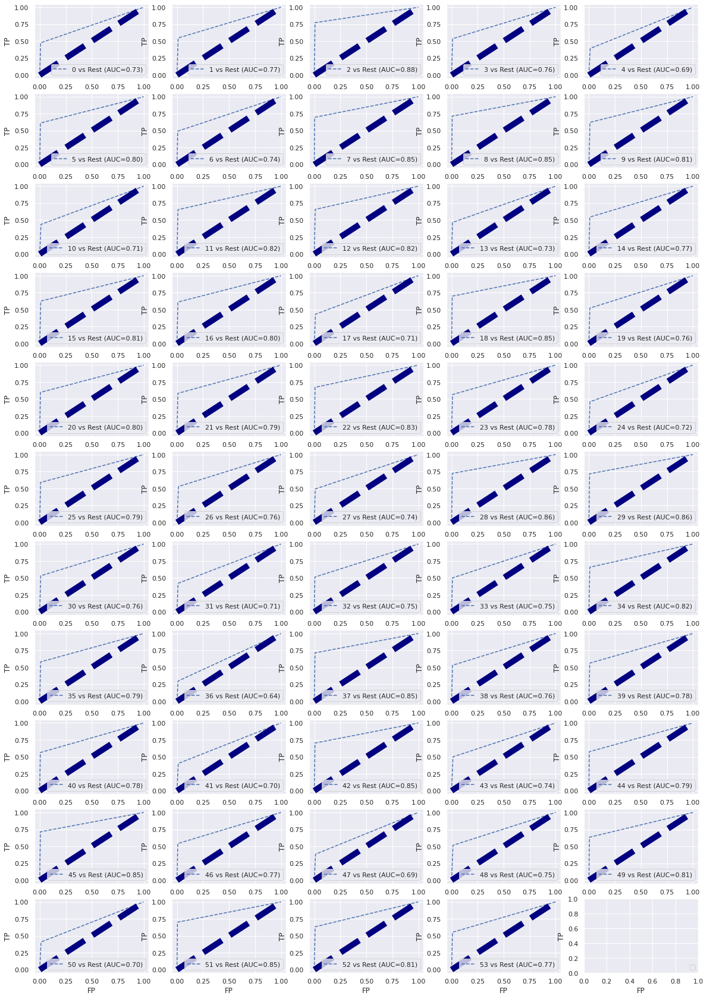

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
model_selection(dtc,x_train,y_train,x_test,y_test)

# Ensemble Methods

# RandomForestClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

parameter={'criterion':['gini', 'entropy', 'log_loss'],
          'max_features' : [None,"sqrt","log2"],
           'class_weight':['balanced',' balanced_subsample'],
           'oob_score':['True','False'],
           'n_estimators':range(0,100,25)}

rf=RandomForestClassifier()
clf=GridSearchCV(rf,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 75, 'oob_score': 'True'}


Accuracy of training model : 0.9980138346688583
Accuracy of test data : 0.6954259107093946
cv score is  38.927229544917324

Classification report for test data
               precision    recall  f1-score   support

           0       0.70      0.79      0.74        61
           1       0.64      0.67      0.65        75
           2       0.80      0.89      0.84        66
           3       0.72      0.74      0.73        69
           4       0.60      0.46      0.52        69
           5       0.76      0.67      0.71        67
           6       0.70      0.63      0.67        63
           7       0.95      0.87      0.91        69
           8       0.78      0.79      0.79        77
           9       0.74      0.73      0.73        66
          10       0.51      0.56      0.53        62
          11       0.73      0.83      0.77        75
          12       0.69      0.80      0.74        70
          13       0.52      0.60      0.56        58
          14       0.67     

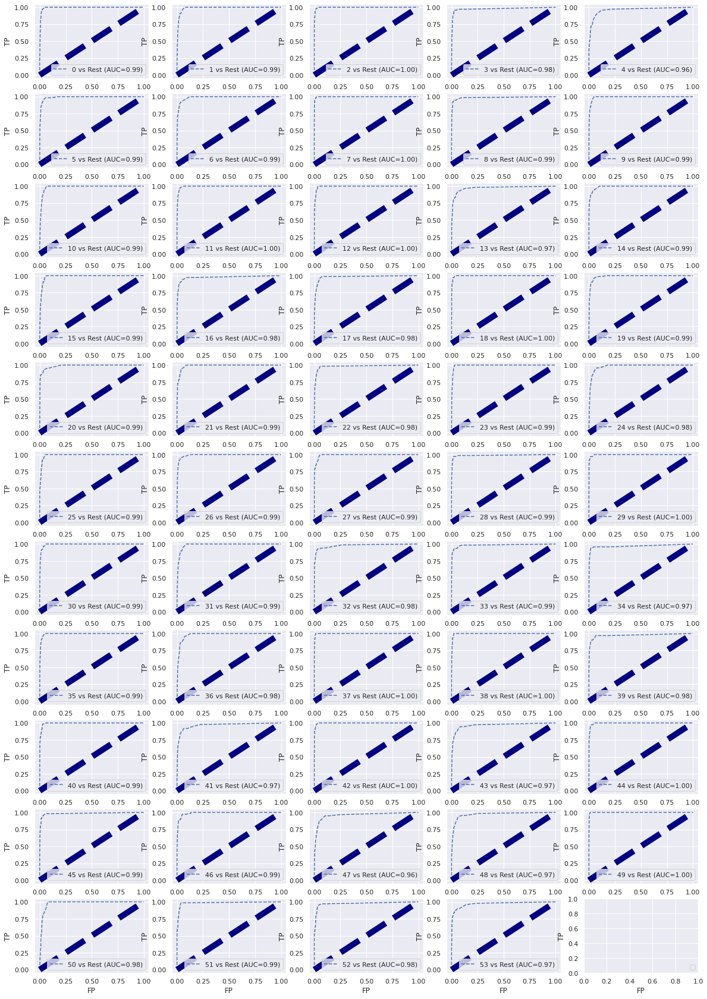

In [ ]:
rf=RandomForestClassifier(n_estimators=75, class_weight= 'balanced',criterion='entropy', max_features='sqrt', oob_score= 'True')
model_selection(rf,x_train,y_train,x_test,y_test)

# AdaBoostClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostClassifier

parameter={'algorithm':['SAMME', 'SAMME.R'],
          'learning_rate' : [0.0,1.0,2.0],
           'random_state':range(0,100,25),
           'n_estimators':range(0,100,25)}

rf2=AdaBoostClassifier()
clf=GridSearchCV(rf2,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'algorithm': 'SAMME.R', 'learning_rate': 2.0, 'n_estimators': 75, 'random_state': 25}


Accuracy of training model : 0.11156770084240805
Accuracy of test data : 0.11284579567241852
cv score is  7.905731212690838

Classification report for test data
               precision    recall  f1-score   support

           0       0.10      0.03      0.05        61
           1       0.06      0.03      0.04        75
           2       0.22      0.24      0.23        66
           3       0.23      0.09      0.13        69
           4       0.04      0.01      0.02        69
           5       0.12      0.12      0.12        67
           6       0.47      0.11      0.18        63
           7       0.20      0.29      0.24        69
           8       0.00      0.00      0.00        77
           9       0.04      0.03      0.04        66
          10       0.00      0.00      0.00        62
          11       0.19      0.61      0.29        75
          12       0.00      0.00      0.00        70
          13       0.00      0.00      0.00        58
          14       0.06    

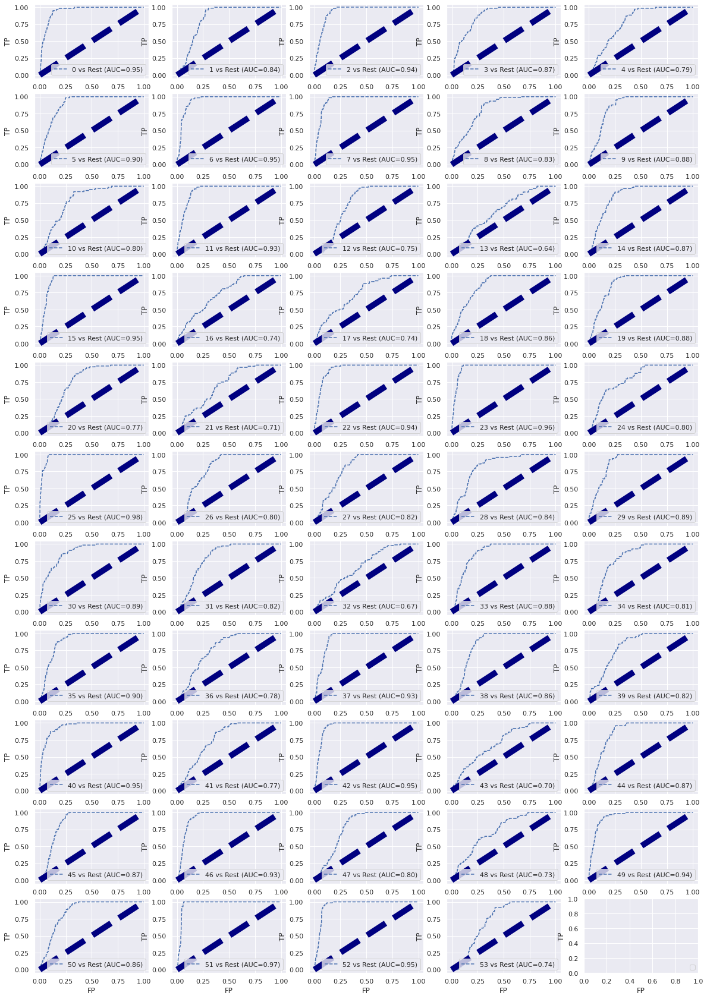

In [ ]:
rf2=AdaBoostClassifier(algorithm='SAMME.R', learning_rate= 2.0, n_estimators= 75,random_state= 25)
model_selection(rf2,x_train,y_train,x_test,y_test)

# GradientBoostingClassifier



In [246]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier

parameter={'loss':['log_loss', 'deviance', 'exponential'],
          'learning_rate' : [0.0,1.0],
           'criterion':['friedman_mse', 'squared_error', 'mse'],
           'max_features':['auto', 'sqrt', 'log2'],
           'n_estimators':range(0,100,50)}

rf3=GradientBoostingClassifier()
clf=GridSearchCV(rf3,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'criterion': 'mse', 'learning_rate': 1.0, 'loss': 'deviance', 'max_features': 'sqrt', 'n_estimators': 50}


Accuracy of training model : 0.03225806451612903
Accuracy of test data : 0.029580936729663106
cv score is  3.8462046427512817

Classification report for test data
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        61
           1       0.00      0.00      0.00        75
           2       0.00      0.00      0.00        66
           3       0.02      0.04      0.02        69
           4       0.00      0.00      0.00        69
           5       0.14      0.04      0.07        67
           6       0.00      0.00      0.00        63
           7       0.30      0.33      0.32        69
           8       0.00      0.00      0.00        77
           9       0.86      0.09      0.16        66
          10       0.00      0.00      0.00        62
          11       0.00      0.00      0.00        75
          12       0.00      0.00      0.00        70
          13       0.03      0.02      0.02        58
          14       0.02  

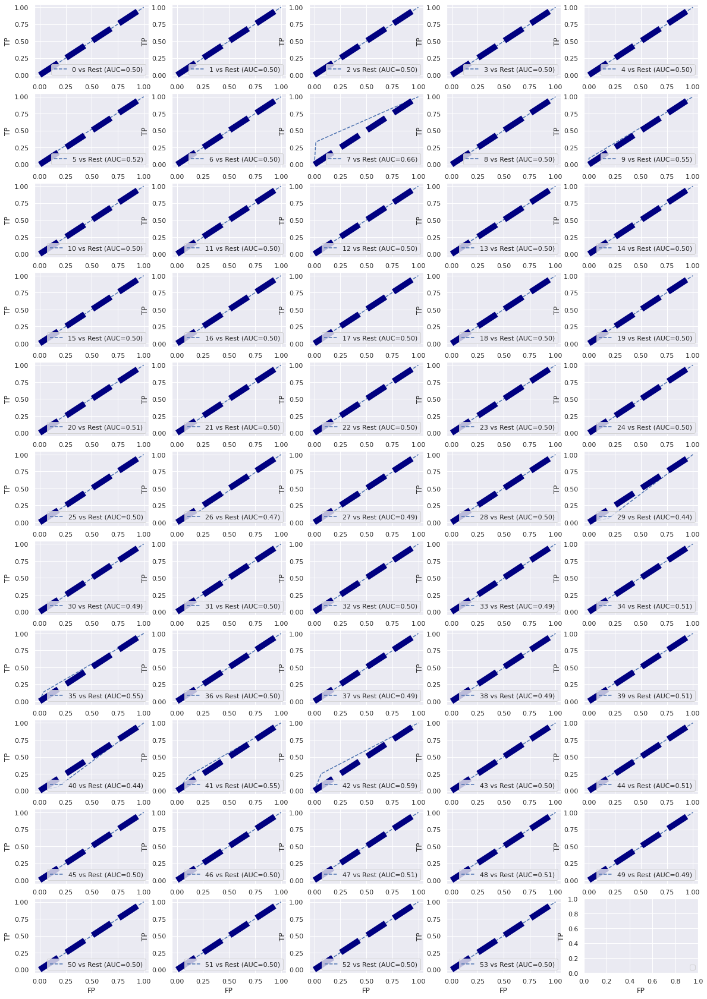

In [248]:
rf3=GradientBoostingClassifier(criterion='mse',learning_rate=1.0, loss='deviance', max_features= 'sqrt', n_estimators= 50)
model_selection(rf3,x_train,y_train,x_test,y_test)

# BaggingClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier

parameter={
           'oob_score': [True,False],
           'n_jobs':range(0,100,25),
           'random_state':range(0,100,25),
           'n_estimators':range(0,100,25)}

rf4=BaggingClassifier()
clf=GridSearchCV(rf4,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_estimators': 75, 'n_jobs': 25, 'oob_score': True, 'random_state': 75}


Accuracy of training model : 0.9980138346688583
Accuracy of test data : 0.6787181594083813
cv score is  36.87271117314454

Classification report for test data
               precision    recall  f1-score   support

           0       0.66      0.74      0.70        61
           1       0.57      0.65      0.61        75
           2       0.73      0.83      0.78        66
           3       0.68      0.65      0.67        69
           4       0.60      0.45      0.51        69
           5       0.66      0.67      0.67        67
           6       0.60      0.59      0.59        63
           7       0.91      0.86      0.88        69
           8       0.76      0.79      0.78        77
           9       0.70      0.71      0.71        66
          10       0.49      0.61      0.55        62
          11       0.71      0.76      0.74        75
          12       0.68      0.74      0.71        70
          13       0.51      0.60      0.56        58
          14       0.56      

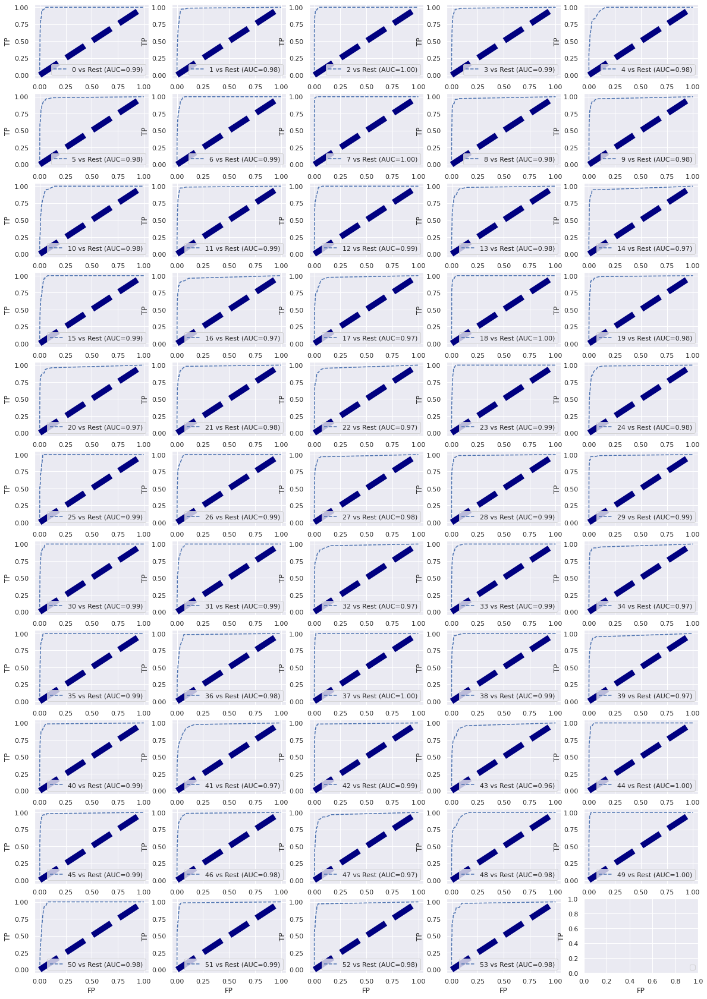

In [247]:
rf4=BaggingClassifier(n_jobs=25, oob_score= True, random_state=75, n_estimators= 75)
model_selection(rf4,x_train,y_train,x_test,y_test)

# StackingClassifier

In [249]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import StackingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

estimators = [ ('knc', KNeighborsClassifier()), ('svr',SVC()) ]
parameter={
            'stack_method':['auto', 'predict_proba', 'decision_function', 'predict'],
           'n_jobs':range(0,100,25)
         }

rf5=StackingClassifier(estimators)
clf=GridSearchCV(rf5,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_jobs': 25, 'stack_method': 'auto'}


Accuracy of training model : 0.5401684816108485
Accuracy of test data : 0.5193097781429745
cv score is  27.958918367270368

Classification report for test data
               precision    recall  f1-score   support

           0       0.45      0.62      0.52        61
           1       0.52      0.57      0.54        75
           2       0.59      0.71      0.64        66
           3       0.56      0.54      0.55        69
           4       0.37      0.41      0.39        69
           5       0.43      0.36      0.39        67
           6       0.52      0.71      0.60        63
           7       0.83      0.78      0.81        69
           8       0.57      0.58      0.58        77
           9       0.60      0.58      0.59        66
          10       0.33      0.37      0.35        62
          11       0.56      0.61      0.59        75
          12       0.56      0.63      0.59        70
          13       0.36      0.50      0.42        58
          14       0.60     

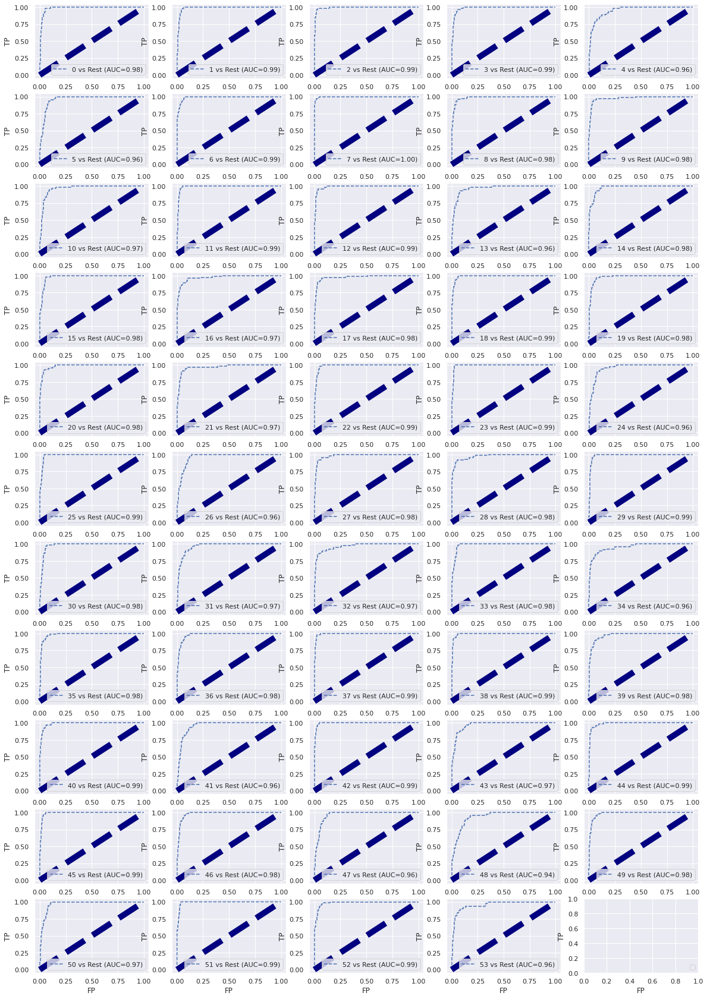

In [250]:
rf5=StackingClassifier(estimators,n_jobs=25, stack_method= 'auto')
model_selection(rf5,x_train,y_train,x_test,y_test)

# Model Saving

In [251]:
import pickle
filename='rfz.pk1'
pickle.dump(rf,open(filename,'wb'))

We selected RandomForest Classifier model since
- it has best cross validation score among all the model and high accuracy.
- average auc score for classes is 0.99

# Loading Model

In [252]:
loaded_model=pickle.load(open('rfz.pk1','rb'))
result=loaded_model.score(x_test,y_test)
print("Model Accuracy:",result*100)

Model Accuracy: 69.62476033963297


# Testing Loaded Model

In [261]:
def test_inp():
  inp = []
  i=0
  print("Enter single input\n")
  while i<7:
    inn=float(input(f"Enter input {i+1}: "))
    inp.append(inn)
    i=i+1
  input_data_as_numpy_array = np.asarray(inp)
  input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)
  prediction = loaded_model.predict(input_data_reshaped)
  print("\nRegion",prediction[:])

In [257]:
X=pd.DataFrame(x)
Y=pd.DataFrame(y)
print("Input\n",X.head(1),"\n\nOutput\n",Y.head(1))
print("\nInput\n",X.tail(1),"\n\nOutput\n",Y.tail(1))

Input
           0         1         2         3         4         5        6
0 -0.063763 -0.740708 -0.141131 -0.360325 -0.347636 -0.288255 -0.12525 

Output
    region
0       0

Input
               0         1         2         3         4         5         6
18251  0.596941  0.164609  0.373235  0.070199  0.045259  0.179744  0.020623 

Output
        region
18251      53


In above table we have seen that 
- Input 0th row gives output Region 0  
-Input 18251th row gives output Region 53 

So we can use this input data with loaded model to test if model gives correct output

In [262]:
test_inp()

Enter single input

Enter input 1: -0.063763 
Enter input 2:  -0.740708
Enter input 3:  -0.141131 
Enter input 4: -0.360325 
Enter input 5: -0.347636 
Enter input 6: -0.288255 
Enter input 7: -0.12525

Region [0]


In [263]:
test_inp()

Enter single input

Enter input 1: 0.596941  
Enter input 2: 0.164609  
Enter input 3: 0.373235  
Enter input 4: 0.070199  
Enter input 5: 0.045259  
Enter input 6: 0.179744  
Enter input 7: 0.020623

Region [53]
